## All TOIs

In [1]:
import chronos as cr

Created TAP+ (v1.2.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
Created TAP+ (v1.2.1) - Connection:
	Host: geadata.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443


In [2]:
tois = cr.get_tois(verbose=True, clobber=False)
tois.tail()

Loaded: /home/jp/github/research/project/chronos/chronos/data/TOIs.csv
TOIs with TFPWG disposition==FP are removed.
Saved: /home/jp/github/research/project/chronos/chronos/data/TOIs.csv



,TIC ID,TOI,Previous CTOI,Master,SG1A,SG1B,SG2,SG3,SG4,SG5,...,Stellar Radius (R_Sun) err,Stellar Metallicity,Stellar Metallicity err,Stellar Mass (M_Sun),Stellar Mass (M_Sun) err,Sectors,Date TOI Alerted (UTC),Date TOI Updated (UTC),Date Modified,Comments
5903,305243225,5798.01,NaN,5,5,5,5,5,5,5,...,0.059658,0.156301,0.02809,1.078000,0.136618,54,2022-09-22,2022-09-22,2022-09-24 12:03:34,HAT-P-23 b
5904,328081248,5799.01,TIC 328081248.01,1,4,1,1,1,4,4,...,0.010272,NaN,NaN,0.326530,0.020234,54,2022-09-22,2022-09-22,2022-09-24 12:03:34,potential multi
5905,151759246,5800.01,NaN,1,4,1,1,1,4,4,...,0.054573,NaN,NaN,0.780000,0.097380,54,2022-09-22,2022-09-22,2022-09-24 12:03:34,NaN
5906,243921117,5801.01,NaN,5,5,5,5,5,5,5,...,0.018883,NaN,NaN,0.616961,0.020263,54,2022-09-22,2022-09-22,2022-09-24 12:03:33,WASP-80 b
5907,399402994,5802.01,NaN,5,5,5,5,5,5,5,...,0.056784,NaN,NaN,1.093000,0.135176,54,2022-09-22,2022-09-22,2022-09-24 12:03:35,WASP-81 b


In [1]:
import chronos as cr

t = cr.Target(toiid=3664, verbose=False)
#Stock_2
gaia_params = t.query_gaia_dr2_catalog(return_nearest_xmatch=True)
nearest_cluster_member = t.get_nearest_cluster_member(catalog_name="CantatGaudin2020", match_id=False)
nearest_cluster_member

Created TAP+ (v1.2.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
Created TAP+ (v1.2.1) - Connection:
	Host: geadata.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
There are 15 gaia sources within 30.0 arcsec.
High proper-motion star:
(pmra,pmdec)=(-7.62,8.73) mas/yr
Using CantatGaudin2020 catalog.
Separation between target & nearest cluster star=51.09 pc


raJ2015                            45.4121
decJ2015                           58.8857
source_id               461287321613739520
parallax                            2.2664
pmra                                 0.659
pmdec                               -2.028
radial_velocity                        NaN
phot_g_mean_mag                    17.9329
bp_rp                               2.1777
Proba                                 0.11
Cluster                       COIN-Gaia_37
ra                                 45.4121
dec                                58.8857
distance_to_target    51.09307400937077 pc
Name: 57502, dtype: object

## Individual

In [2]:
import flammkuchen as fk
from pathlib import Path

fp = Path(cr.DATA_PATH+"/toi_gaia_params.hdf5")
if fp.exists():
    tois_gaia = fk.load(fp)
else:
    tois_gaia = cr.query_gaia_params_of_all_tois(clobber=False, update=True)
    tois_gaia.source_id = tois_gaia.source_id.astype(int)
    
tois_gaia = cr.query_gaia_params_of_all_tois(clobber=False, update=True)

Loaded: /home/jp/github/research/project/chronos/chronos/data/TOIs.csv
TOIs with TFPWG disposition==FP are removed.
Saved: /home/jp/github/research/project/chronos/chronos/data/TOIs.csv

Querying Gaia DR2 catalog for new TOIs



  0%|          | 0/5085 [00:00<?, ?it/s]

Target: TOI 798
Querying Gaia DR2 catalog for ra,dec=(97.8205 -58.3204) within 30.00 arcsec.


 12%|█▏        | 617/5085 [00:01<00:11, 376.91it/s]

No gaia star within 30.0 arcsec. Use radius>30.0 arcsec
Target: TOI 3634
Querying Gaia DR2 catalog for ra,dec=(12.5696 27.5688) within 30.00 arcsec.


100%|██████████| 5085/5085 [00:02<00:00, 2387.05it/s]

No gaia star within 30.0 arcsec. Use radius>30.0 arcsec


Saved: /home/jp/github/research/project/chronos/chronos/data/toi_gaia_params.hdf5


In [5]:
import pandas as pd

catalogs = ["He2022a", "He2022b", "CantatGaudin2020"]
short_lists = {}
for catalog in catalogs:
    cc = cr.ClusterCatalog(catalog_name=catalog)
    df_mem = cc.query_catalog(return_members=True)

    idx1 = df_mem.source_id.isin(tois_gaia.source_id)
    idx2 = tois_gaia.source_id.isin(df_mem.source_id)

    #merge
    # cols = ['source_id','clusters','reference','Cluster','k13_name_match','k13_logt','distance']
    cols = df_mem.columns
    short_list = pd.merge(left=tois_gaia.loc[idx2, 'source_id'].reset_index(),
                          right=df_mem.loc[idx1, cols], 
                         on='source_id')
    short_list = short_list.loc[short_list.Cluster.dropna().index] 
    short_lists[catalog] = short_list[['TOI','Cluster','distance']]

Data url: https://vizier.u-strasbg.fr/viz-bin/VizieR?-source=J/ApJS/260/8
Using He2022a catalog.
Data url: https://vizier.u-strasbg.fr/viz-bin/VizieR?-source=J/ApJS/262/7
Using He2022b catalog.
Data url: https://vizier.u-strasbg.fr/viz-bin/VizieR?-source=J/A+A/633/A99
Using CantatGaudin2020 catalog.


In [7]:
pd.concat(short_lists).sort_values(by="distance")

TOI       Cluster     distance
He2022b          28  5095.01    Melotte_25    44.728720
                 7   1227.01     CWNU_1136   100.959112
                 25  4668.01     Alessi_13   105.999576
CantatGaudin2020 11  4668.01     Alessi_13   106.509884
He2022b          29  5358.01    Melotte_22   138.197899
CantatGaudin2020 3    837.01       IC_2602   143.075845
He2022b          26  5071.01      NGC_2632   182.748538
CantatGaudin2020 13  5090.01      NGC_2632   186.542802
He2022b          27  5090.01      NGC_2632   186.950832
CantatGaudin2020 12  5071.01      NGC_2632   189.951562
He2022b          10  1602.01       UPK_303   209.643606
                 17  2595.01     Theia_116   213.037921
                 4   1014.01     CWNU_1013   219.925225
                 15  2311.01     CWNU_1012   275.254611
                 11  1881.01      Alessi_3   282.725474
CantatGaudin2020 5   1881.01      Alessi_3   296.788746
He2022b          24  4622.01        UBC_31   300.480769
                 0    580.01       Pozzo_1   339.558574
                 5   1162.01     Roslund_6   339.789331
                 2    583.01     NGC_2451B   342.817964
                 18  2796.01       LP_2371   349.283968
CantatGaudin2020 0    580.01       Pozzo_1   349.833829
He2022b          6   1191.01  Stephenson_1   354.735722
                 23  4510.01       UPK_540   367.376929
CantatGaudin2020 10  4510.01       UPK_540   377.344251
He2022b          22  4257.01   Trumpler_10   407.331976
                 3    681.01      NGC_2516   409.500410
CantatGaudin2020 4   1497.01         RSG_7   409.903263
He2022b          9   1497.01         RSG_7   417.362270
CantatGaudin2020 2    681.01      NGC_2516   426.493795
He2022b          1    581.01   Trumpler_10   427.715997
                 21  3958.01      ASCC_127   438.404209
CantatGaudin2020 1    581.01   Trumpler_10   439.541119
He2022b          20  3602.01     Theia_178   444.444444
                 12  1918.01      NGC_3532   472.143532
                 13  1986.01   Trumpler_10   482.858522
CantatGaudin2020 7   1918.01      NGC_3532   483.839752
                 6   1882.01       UPK_585   722.752241
He2022b          14   496.01      NGC_2548   759.301443
CantatGaudin2020 8    496.01      NGC_2548   809.192426
He2022b          8   1480.01     CWNU_1115   896.860987
                 16  2538.01      NGC_2215   919.963201
CantatGaudin2020 9   2538.01      NGC_2215   926.955877
He2022b          19  3561.01       UBC_582  1127.395716
He2022a          0   2831.01           110  1268.939497
                 1   3411.01           129  1478.146812

### TOI 5095

Created TAP+ (v1.2.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
Created TAP+ (v1.2.1) - Connection:
	Host: geadata.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
There are 3 gaia sources within 30.0 arcsec.
astrometric_excess_noise_sig=23.44 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(122.15,-18.34) mas/yr
Data url: https://vizier.u-strasbg.fr/viz-bin/VizieR?-source=J/ApJS/262/7
Using He2022b catalog.


AssertionError: radial_velocity is not available in Index(['source_id', 'GLON', 'GLAT', 'parallax', 'e_parallax', 'pmra', 'e_pmra',
       'pmdec', 'e_pmdec', 'RUWE', 'Gmag', 'BP-RP', 'nre', 'Cluster', 'ra',
       'dec', 'distance'],
      dtype='object')

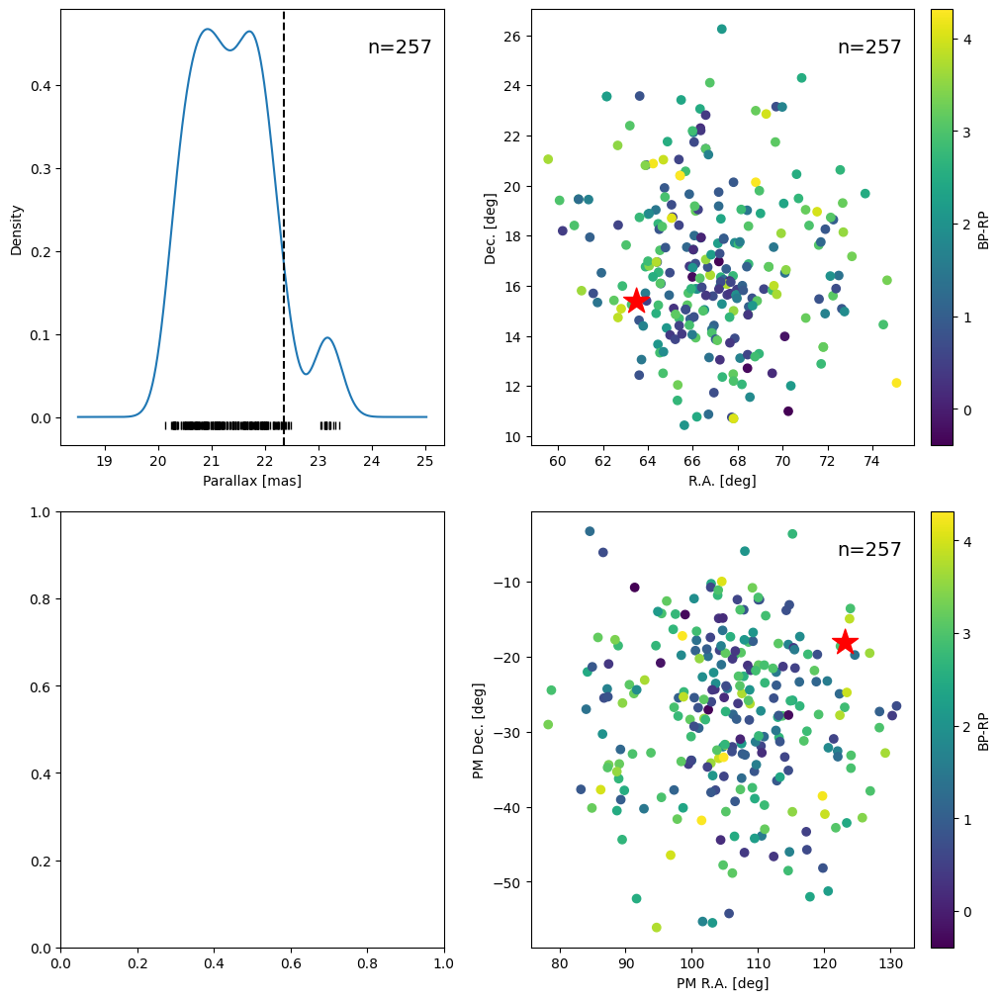

In [1]:
import chronos as cr

t = cr.Target(toiid=5095, verbose=False)
gaia_params = t.query_gaia_dr2_catalog(return_nearest_xmatch=True)
c = cr.Cluster(cluster_name="Melotte_25", catalog_name="He2022b")
# fig = c.plot_xyz_3d(target_gaiaid=t.gaiaid, color="BP-RP");
fig = c.plot_rdp_pmrv(target_gaiaid=t.gaiaid, color="BP-RP");

### TOI 1881

There are 12 gaia sources within 30.0 arcsec.
High proper-motion star:
(pmra,pmdec)=(-10.00,11.58) mas/yr
Using CantatGaudin2020 catalog.
Loaded: /home/jp/github/research/project/chronos/chronos/data/Alessi_3_members.hdf5


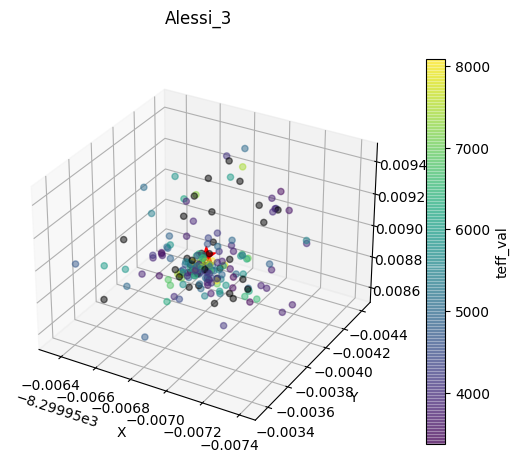

In [3]:
import chronos as cr

t = cr.Target(toiid=1881, verbose=False)
gaia_params = t.query_gaia_dr2_catalog(return_nearest_xmatch=True)
c = cr.Cluster(cluster_name="Alessi_3")

fig = c.plot_xyz_3d(target_gaiaid=t.gaiaid, zlim=(0,100));

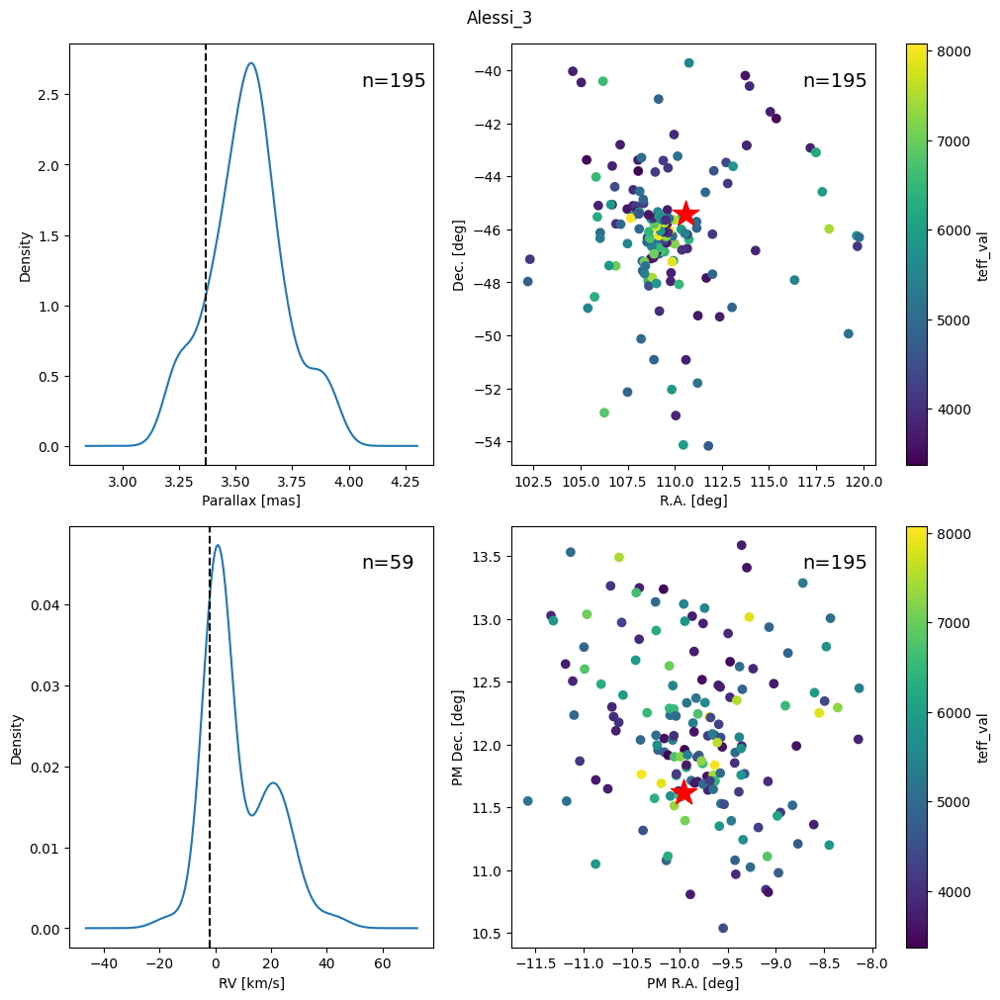

In [4]:
fig = c.plot_rdp_pmrv(target_gaiaid=t.gaiaid);

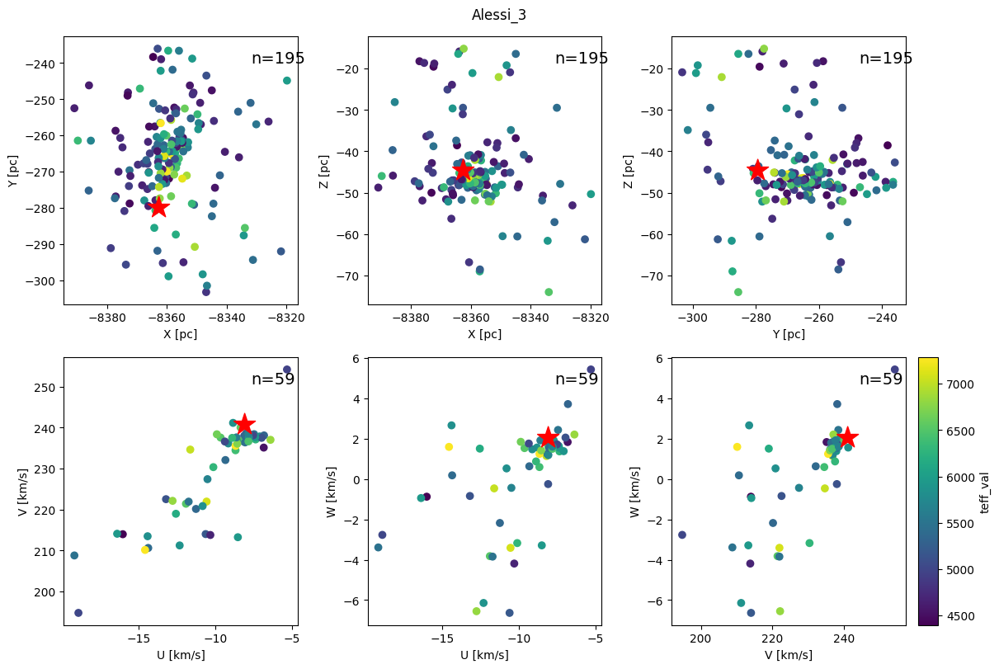

In [5]:
fig = c.plot_xyz_uvw(target_gaiaid=t.gaiaid);

### TOI 1882

There are 19 gaia sources within 30.0 arcsec.
astrometric_excess_noise_sig=6.91 (>5 hints binarity).

astrometric_gof_al=20.19 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf

Using CantatGaudin2020 catalog.
Loaded: /home/jp/github/research/project/chronos/chronos/data/UPK_585_members.hdf5


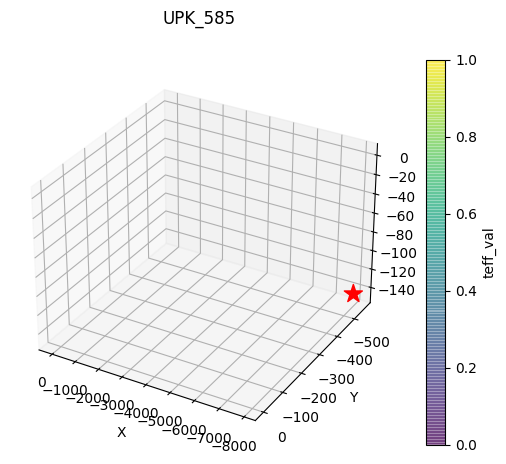

In [6]:
import chronos as cr

t = cr.Target(toiid=1882, verbose=False)
gaia_params = t.query_gaia_dr2_catalog(return_nearest_xmatch=True)
c = cr.Cluster(cluster_name="UPK_585")

fig = c.plot_xyz_3d(target_gaiaid=t.gaiaid, zlim=(0,100));

Error:  `dataset` input should have multiple elements.
Error:  Cluster members have only 1 radial_velocity measurements.


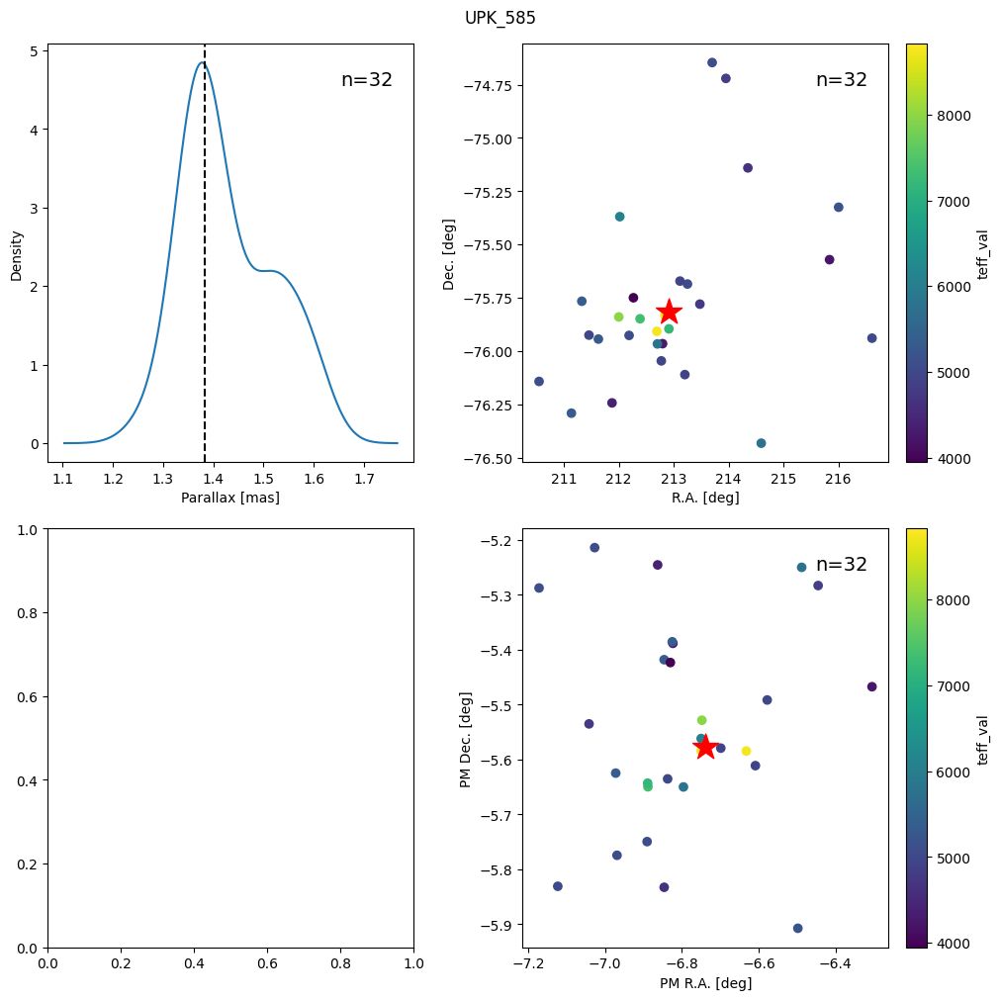

In [7]:
fig = c.plot_rdp_pmrv(target_gaiaid=t.gaiaid);

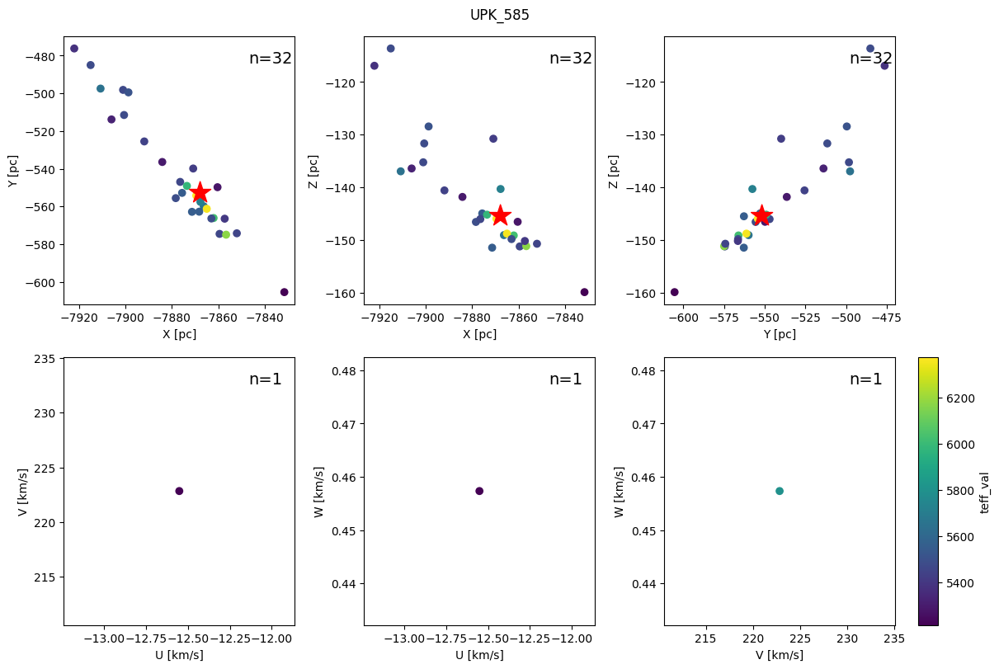

In [8]:
fig = c.plot_xyz_uvw(target_gaiaid=t.gaiaid);

### TOI 2538

There are 9 gaia sources within 30.0 arcsec.
astrometric_excess_noise_sig=5.21 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

Using CantatGaudin2020 catalog.
Loaded: /home/jp/github/research/project/chronos/chronos/data/NGC_2215_members.hdf5


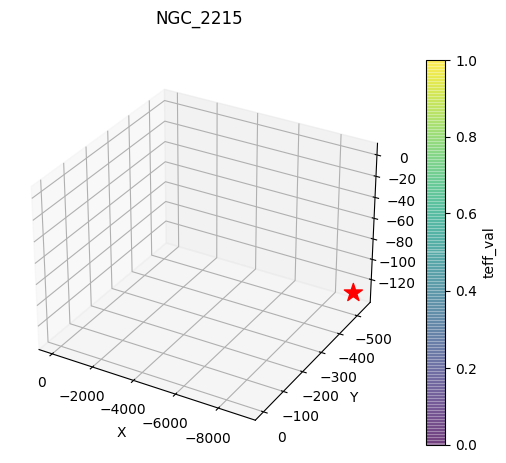

In [9]:
import chronos as cr

t = cr.Target(toiid=2538, verbose=False)
gaia_params = t.query_gaia_dr2_catalog(return_nearest_xmatch=True)
c = cr.Cluster(cluster_name="NGC_2215")

fig = c.plot_xyz_3d(target_gaiaid=t.gaiaid, zlim=(0,100));

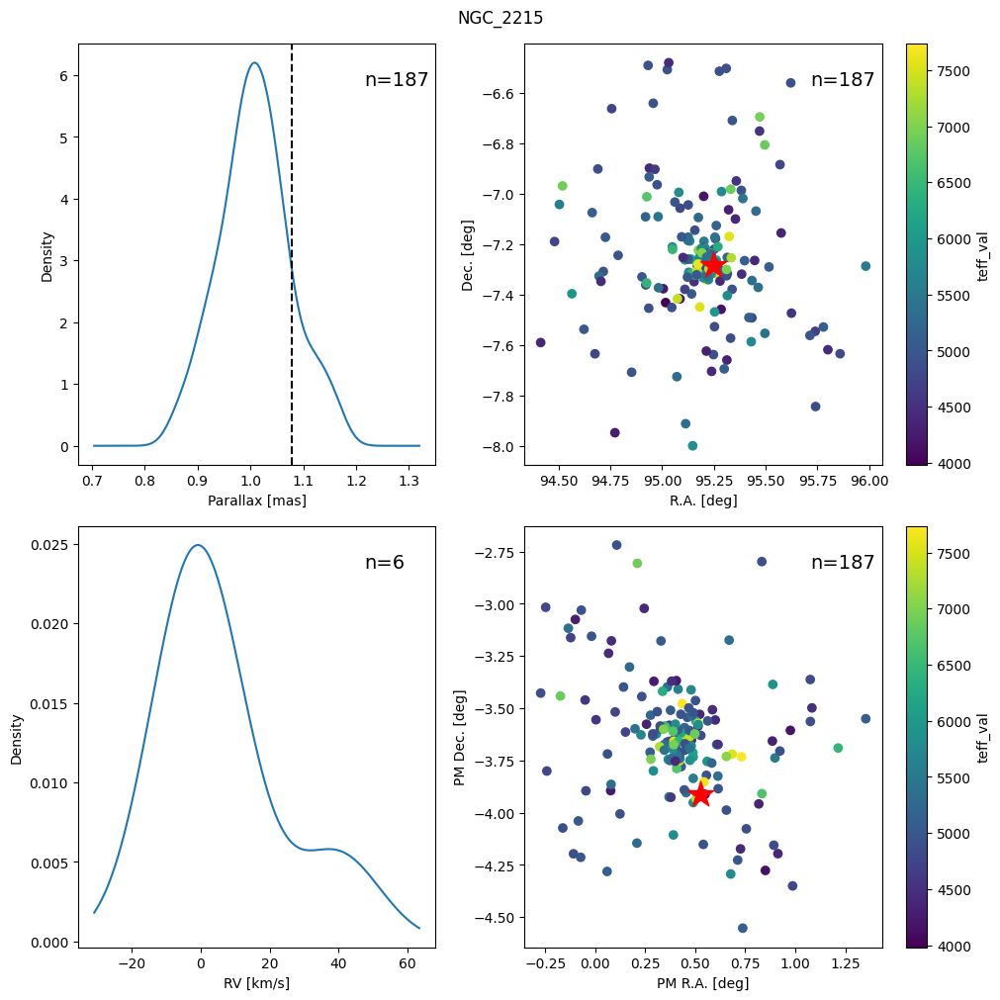

In [10]:
fig = c.plot_rdp_pmrv(target_gaiaid=t.gaiaid);

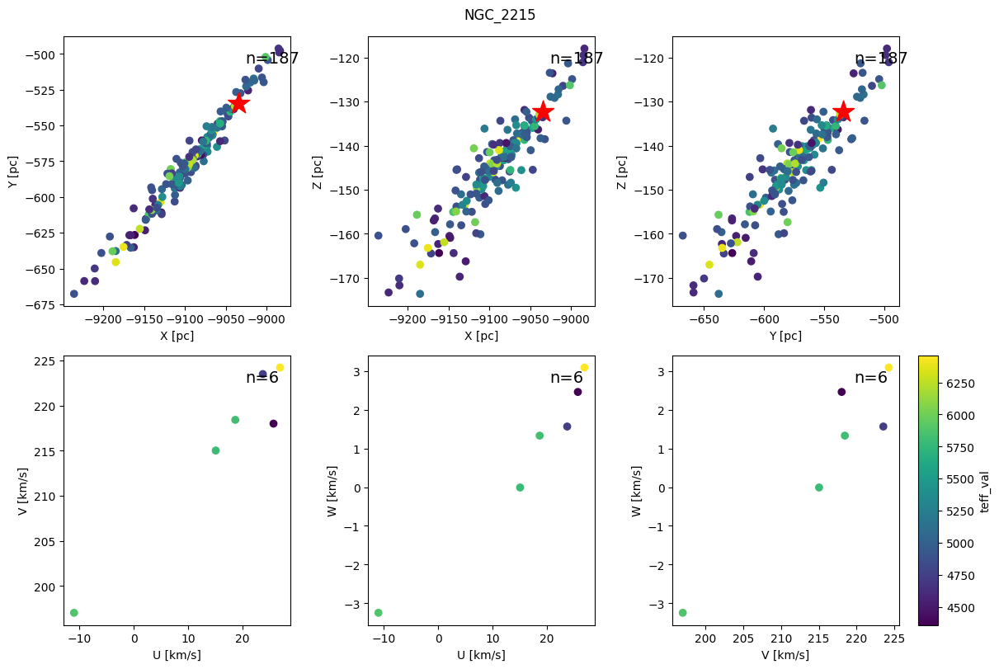

In [11]:
fig = c.plot_xyz_uvw(target_gaiaid=t.gaiaid);

### TOI 3353

In [12]:
import chronos as cr

t = cr.Target(toiid=3353, verbose=False)
gaia_params = t.query_gaia_dr2_catalog(return_nearest_xmatch=True)
nearest_cluster_member = t.get_nearest_cluster_member(catalog_name="CantatGaudin2020", match_id=False)
nearest_cluster_member

There are 4 gaia sources within 30.0 arcsec.
High proper-motion star:
(pmra,pmdec)=(-5.96,38.60) mas/yr
Using CantatGaudin2020 catalog.
Separation between target & nearest cluster star=19.27 pc


raJ2015                            131.986
decJ2015                          -78.9147
source_id              5209118305765620096
parallax                           10.4522
pmra                               -30.138
pmdec                               26.514
radial_velocity                        NaN
phot_g_mean_mag                    12.0523
bp_rp                               2.4634
Proba                                    1
Cluster                          Mamajek_1
ra                                 131.986
dec                               -78.9148
distance_to_target    19.26655659723692 pc
Name: 163558, dtype: object

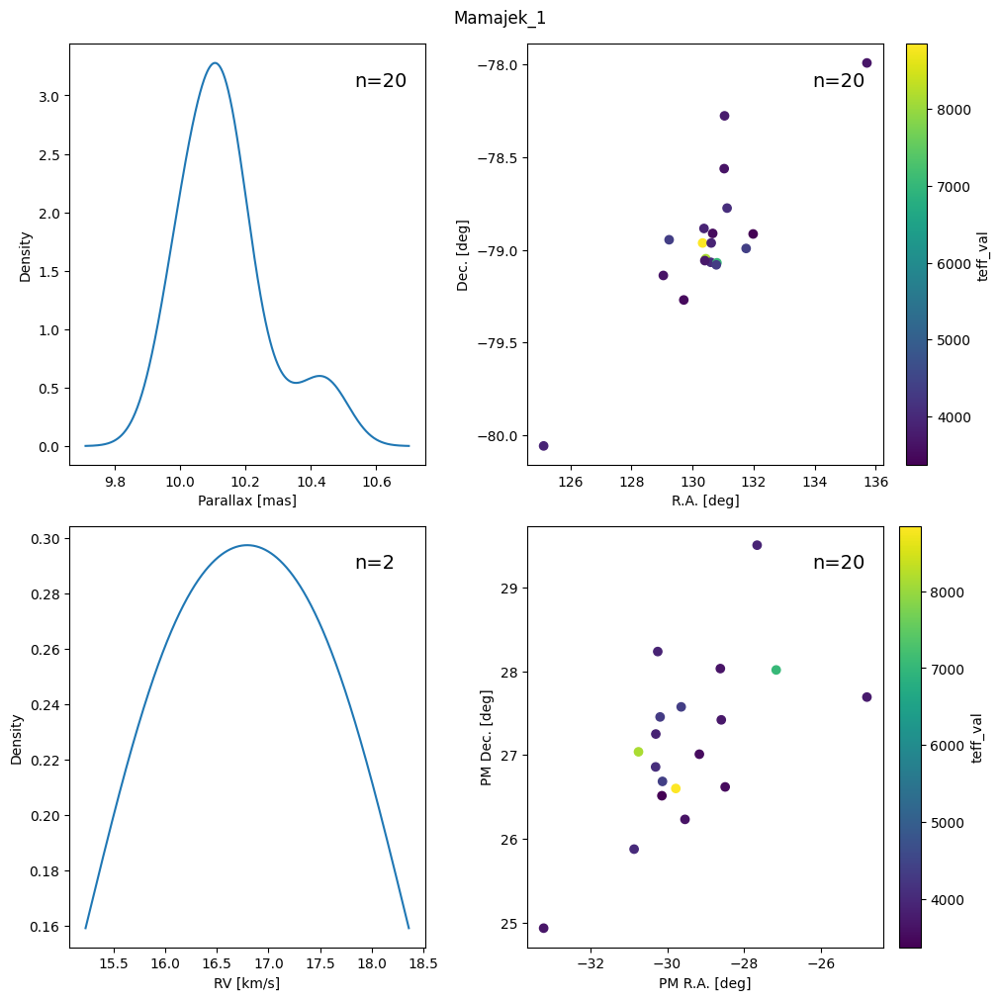

In [18]:
fig = c.plot_rdp_pmrv();

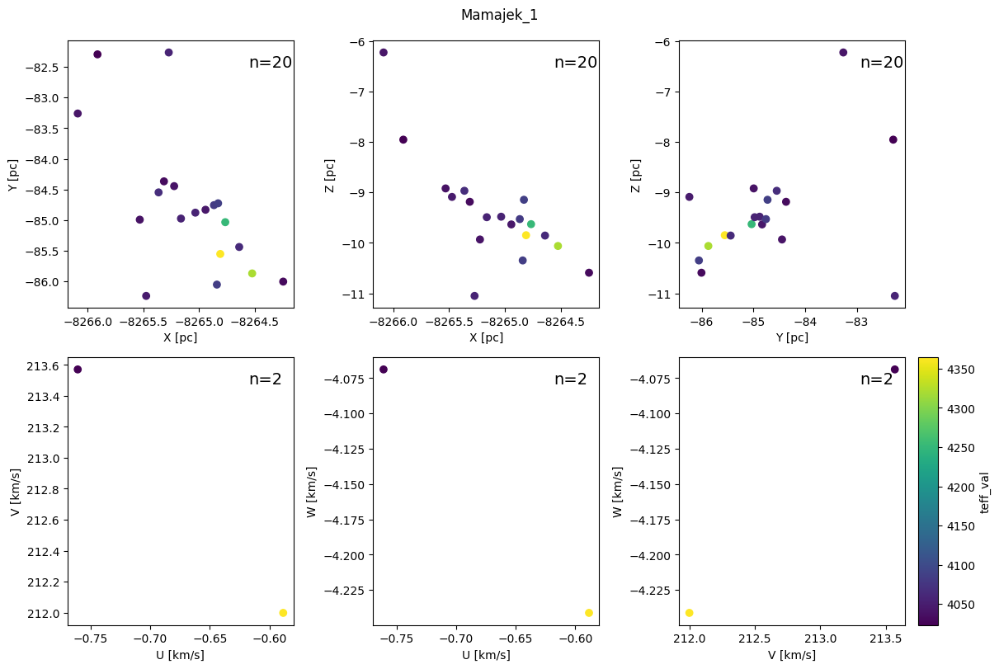

In [19]:
fig = c.plot_xyz_uvw();

### TOI 4510

There are 6 gaia sources within 30.0 arcsec.
Using CantatGaudin2020 catalog.


  0%|          | 0/53 [00:00<?, ?it/s]

Querying Gaia DR2 for 53 UPK_540 members.

Target: Gaia DR2 5486117381093943808
Querying Gaia DR2 catalog for ra,dec=(113.618 -57.5924) within 3.00 arcsec.


  2%|▏         | 1/53 [00:12<10:36, 12.24s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5486154489611776128
Querying Gaia DR2 catalog for ra,dec=(113.995 -57.2357) within 3.00 arcsec.


  4%|▍         | 2/53 [00:23<10:03, 11.83s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5486140947577450368
Querying Gaia DR2 catalog for ra,dec=(113.727 -57.5533) within 3.00 arcsec.
astrometric_excess_noise_sig=11.00 (>5 hints binarity).

astrometric_gof_al=23.31 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf



  6%|▌         | 3/53 [00:37<10:34, 12.68s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5486115212133294976
Querying Gaia DR2 catalog for ra,dec=(113.434 -57.6793) within 3.00 arcsec.


  8%|▊         | 4/53 [00:49<10:06, 12.38s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5486146105835172096
Querying Gaia DR2 catalog for ra,dec=(113.667 -57.4063) within 3.00 arcsec.
There are 2 gaia sources within 3.0 arcsec.


  9%|▉         | 5/53 [01:01<09:49, 12.29s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5486285881250868096
Querying Gaia DR2 catalog for ra,dec=(111.903 -57.3188) within 3.00 arcsec.
astrometric_excess_noise_sig=8.19 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf



 11%|█▏        | 6/53 [01:14<09:44, 12.44s/it]

Found 0 references in Vizier with `ruwe`.
Target: Gaia DR2 5486184932339361536
Querying Gaia DR2 catalog for ra,dec=(113.068 -57.3689) within 3.00 arcsec.


 13%|█▎        | 7/53 [01:29<10:09, 13.25s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5487678580228277120
Querying Gaia DR2 catalog for ra,dec=(115.506 -56.7478) within 3.00 arcsec.
There are 2 gaia sources within 3.0 arcsec.


 15%|█▌        | 8/53 [01:41<09:36, 12.81s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5487652123231620736
Querying Gaia DR2 catalog for ra,dec=(115.143 -56.9545) within 3.00 arcsec.


 17%|█▋        | 9/53 [01:52<08:57, 12.21s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5487650409541207680
Querying Gaia DR2 catalog for ra,dec=(114.984 -56.9766) within 3.00 arcsec.
astrometric_excess_noise_sig=115.70 (>5 hints binarity).

astrometric_gof_al=54.24 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf



 19%|█▉        | 10/53 [02:03<08:39, 12.09s/it]

Found 1 references in Vizier with `ruwe`.
RUWE=3.4>1.4 means target is non-single or otherwise problematic for the astrometric solution.
Target: Gaia DR2 5487754794426456576
Querying Gaia DR2 catalog for ra,dec=(115.647 -56.1781) within 3.00 arcsec.


 21%|██        | 11/53 [02:15<08:17, 11.84s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5295126370194447232
Querying Gaia DR2 catalog for ra,dec=(115.567 -58.613) within 3.00 arcsec.


 23%|██▎       | 12/53 [02:27<08:11, 11.98s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5295113828889925504
Querying Gaia DR2 catalog for ra,dec=(115.752 -58.652) within 3.00 arcsec.
astrometric_excess_noise_sig=11.67 (>5 hints binarity).

astrometric_gof_al=24.40 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf



 25%|██▍       | 13/53 [02:40<08:12, 12.31s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5295203640946985088
Querying Gaia DR2 catalog for ra,dec=(115.505 -58.0149) within 3.00 arcsec.


 26%|██▋       | 14/53 [02:55<08:28, 13.04s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5295178219039342976
Querying Gaia DR2 catalog for ra,dec=(115.532 -58.4779) within 3.00 arcsec.


 28%|██▊       | 15/53 [03:09<08:29, 13.41s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5295126507633392128
Querying Gaia DR2 catalog for ra,dec=(115.639 -58.6233) within 3.00 arcsec.


 30%|███       | 16/53 [03:24<08:31, 13.83s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5295459934534038528
Querying Gaia DR2 catalog for ra,dec=(114.908 -57.6949) within 3.00 arcsec.


 32%|███▏      | 17/53 [03:37<08:06, 13.51s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5292736783532948352
Querying Gaia DR2 catalog for ra,dec=(114.521 -60.1312) within 3.00 arcsec.
There are 2 gaia sources within 3.0 arcsec.
astrometric_excess_noise_sig=6.72 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf



 34%|███▍      | 18/53 [03:50<07:49, 13.42s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5292720462657589120
Querying Gaia DR2 catalog for ra,dec=(114.697 -60.2328) within 3.00 arcsec.


 36%|███▌      | 19/53 [04:03<07:29, 13.23s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5292771899184008832
Querying Gaia DR2 catalog for ra,dec=(115.324 -59.7628) within 3.00 arcsec.


 38%|███▊      | 20/53 [04:18<07:38, 13.88s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5292739880205153920
Querying Gaia DR2 catalog for ra,dec=(114.876 -59.9512) within 3.00 arcsec.


 40%|███▉      | 21/53 [04:33<07:35, 14.24s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5292824439521030016
Querying Gaia DR2 catalog for ra,dec=(115.506 -59.4426) within 3.00 arcsec.


 42%|████▏     | 22/53 [04:46<07:10, 13.88s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5292821003547343104
Querying Gaia DR2 catalog for ra,dec=(115.428 -59.5858) within 3.00 arcsec.


 43%|████▎     | 23/53 [04:59<06:45, 13.53s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5292851789872717440
Querying Gaia DR2 catalog for ra,dec=(115.577 -59.1039) within 3.00 arcsec.


 45%|████▌     | 24/53 [05:11<06:24, 13.25s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293477927384665472
Querying Gaia DR2 catalog for ra,dec=(113.38 -59.6445) within 3.00 arcsec.


 47%|████▋     | 25/53 [05:24<06:02, 12.94s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293641685898319744
Querying Gaia DR2 catalog for ra,dec=(114.41 -58.9415) within 3.00 arcsec.
astrometric_excess_noise_sig=8.04 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf



 49%|████▉     | 26/53 [05:37<05:53, 13.08s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293632236970497024
Querying Gaia DR2 catalog for ra,dec=(114.117 -59.1238) within 3.00 arcsec.


 51%|█████     | 27/53 [05:49<05:28, 12.63s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293624879690206720
Querying Gaia DR2 catalog for ra,dec=(115.445 -58.6738) within 3.00 arcsec.


 53%|█████▎    | 28/53 [06:00<05:02, 12.11s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293676526673314816
Querying Gaia DR2 catalog for ra,dec=(115.301 -58.5579) within 3.00 arcsec.


 55%|█████▍    | 29/53 [06:13<05:02, 12.60s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293607631101019136
Querying Gaia DR2 catalog for ra,dec=(115.266 -58.9881) within 3.00 arcsec.


 57%|█████▋    | 30/53 [06:25<04:44, 12.36s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293689171057089920
Querying Gaia DR2 catalog for ra,dec=(114.614 -58.5028) within 3.00 arcsec.


 58%|█████▊    | 31/53 [06:41<04:53, 13.35s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293673090699519872
Querying Gaia DR2 catalog for ra,dec=(114.874 -58.6051) within 3.00 arcsec.


 60%|██████    | 32/53 [06:55<04:43, 13.50s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293644297238384896
Querying Gaia DR2 catalog for ra,dec=(114.177 -58.8961) within 3.00 arcsec.


 62%|██████▏   | 33/53 [07:08<04:28, 13.45s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293623750115255296
Querying Gaia DR2 catalog for ra,dec=(115.446 -58.7432) within 3.00 arcsec.
astrometric_excess_noise_sig=5.93 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf



 64%|██████▍   | 34/53 [07:22<04:17, 13.53s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293579765354139904
Querying Gaia DR2 catalog for ra,dec=(114.275 -59.3094) within 3.00 arcsec.


 66%|██████▌   | 35/53 [07:35<04:01, 13.41s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293571282794683264
Querying Gaia DR2 catalog for ra,dec=(114.739 -59.3153) within 3.00 arcsec.
astrometric_excess_noise_sig=56.93 (>5 hints binarity).

astrometric_gof_al=32.42 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf



 68%|██████▊   | 36/53 [07:51<04:04, 14.39s/it]

Found 0 references in Vizier with `ruwe`.
Target: Gaia DR2 5293682363530757504
Querying Gaia DR2 catalog for ra,dec=(114.499 -58.7115) within 3.00 arcsec.


 70%|██████▉   | 37/53 [08:08<04:01, 15.08s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293621138774904064
Querying Gaia DR2 catalog for ra,dec=(115.211 -58.8707) within 3.00 arcsec.
astrometric_excess_noise_sig=12.45 (>5 hints binarity).

astrometric_gof_al=24.58 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf



 72%|███████▏  | 38/53 [08:24<03:50, 15.38s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293563723652377984
Querying Gaia DR2 catalog for ra,dec=(114.162 -59.5268) within 3.00 arcsec.


 74%|███████▎  | 39/53 [08:39<03:31, 15.12s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293573138220547840
Querying Gaia DR2 catalog for ra,dec=(114.644 -59.2786) within 3.00 arcsec.


 75%|███████▌  | 40/53 [08:53<03:11, 14.72s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293644018063810048
Querying Gaia DR2 catalog for ra,dec=(114.184 -58.9289) within 3.00 arcsec.


 77%|███████▋  | 41/53 [09:05<02:49, 14.14s/it]

Found 0 references in Vizier with `ruwe`.
Target: Gaia DR2 5293756894100836352
Querying Gaia DR2 catalog for ra,dec=(112.917 -58.8609) within 3.00 arcsec.
astrometric_excess_noise_sig=5.92 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf



 79%|███████▉  | 42/53 [09:18<02:32, 13.84s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293858319753043968
Querying Gaia DR2 catalog for ra,dec=(113.454 -58.6993) within 3.00 arcsec.


 81%|████████  | 43/53 [09:31<02:13, 13.31s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293947143972702848
Querying Gaia DR2 catalog for ra,dec=(114.201 -58.0566) within 3.00 arcsec.
astrometric_excess_noise_sig=12365.64 (>5 hints binarity).

astrometric_gof_al=417.62 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf



 83%|████████▎ | 44/53 [09:45<02:02, 13.64s/it]

Found 1 references in Vizier with `ruwe`.
RUWE=34.2>1.4 means target is non-single or otherwise problematic for the astrometric solution.
Target: Gaia DR2 5293901067563567104
Querying Gaia DR2 catalog for ra,dec=(114.477 -58.0255) within 3.00 arcsec.


 85%|████████▍ | 45/53 [10:00<01:51, 13.99s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293899688876729088
Querying Gaia DR2 catalog for ra,dec=(114.261 -58.1019) within 3.00 arcsec.


 87%|████████▋ | 46/53 [10:12<01:34, 13.56s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293906221524227968
Querying Gaia DR2 catalog for ra,dec=(114.916 -57.9279) within 3.00 arcsec.


 89%|████████▊ | 47/53 [10:25<01:20, 13.42s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293947143972702976
Querying Gaia DR2 catalog for ra,dec=(114.204 -58.0561) within 3.00 arcsec.


 91%|█████████ | 48/53 [10:39<01:07, 13.47s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293966179267567104
Querying Gaia DR2 catalog for ra,dec=(114.171 -57.8314) within 3.00 arcsec.


 92%|█████████▏| 49/53 [10:51<00:51, 12.94s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293916254568004864
Querying Gaia DR2 catalog for ra,dec=(113.343 -58.3519) within 3.00 arcsec.


 94%|█████████▍| 50/53 [11:03<00:38, 12.80s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293952675890560256
Querying Gaia DR2 catalog for ra,dec=(114.124 -57.8959) within 3.00 arcsec.
There are 2 gaia sources within 3.0 arcsec.


 96%|█████████▌| 51/53 [11:18<00:26, 13.27s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5293952675888024064
Querying Gaia DR2 catalog for ra,dec=(114.124 -57.8964) within 3.00 arcsec.
There are 2 gaia sources within 3.0 arcsec.
astrometric_excess_noise_sig=5.01 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf



 98%|█████████▊| 52/53 [11:32<00:13, 13.66s/it]

Found 1 references in Vizier with `ruwe`.
RUWE=1.6>1.4 means target is non-single or otherwise problematic for the astrometric solution.
Target: Gaia DR2 5293913643227915264
Querying Gaia DR2 catalog for ra,dec=(113.555 -58.3811) within 3.00 arcsec.


100%|██████████| 53/53 [11:48<00:00, 14.33s/it]

Found 1 references in Vizier with `ruwe`.
Saved: /home/jp/github/research/project/chronos/chronos/data/UPK_540_members.hdf5


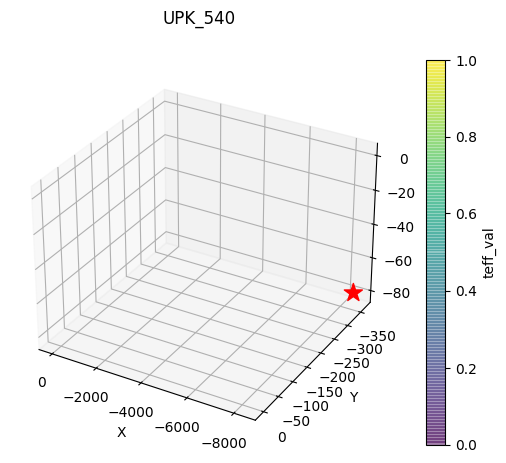

In [20]:
import chronos as cr

t = cr.Target(toiid=4510, verbose=False)
gaia_params = t.query_gaia_dr2_catalog(return_nearest_xmatch=True)
c = cr.Cluster(cluster_name="UPK_540")
fig = c.plot_xyz_3d(target_gaiaid=t.gaiaid, zlim=(0,100));

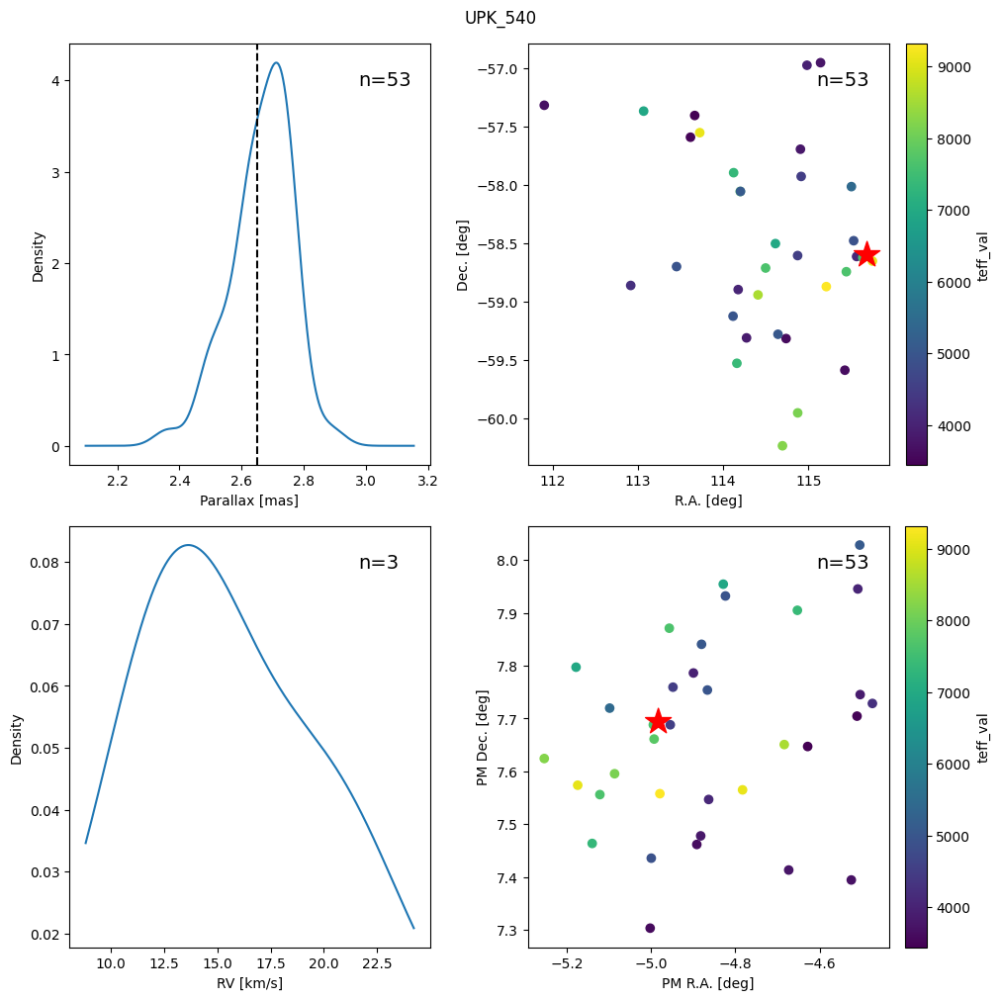

In [21]:
fig = c.plot_rdp_pmrv(target_gaiaid=t.gaiaid);

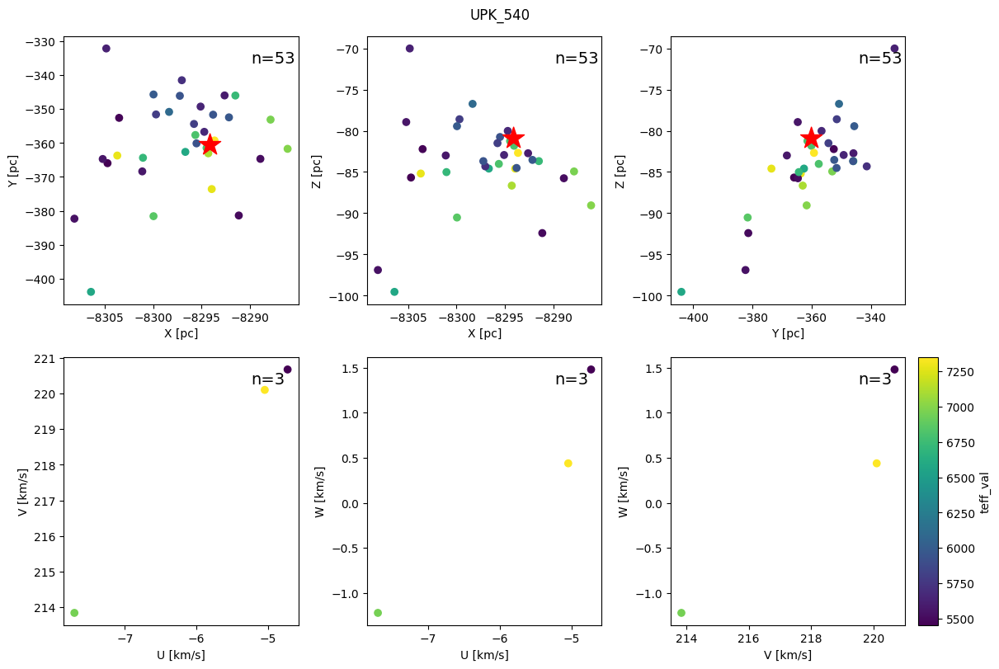

In [22]:
fig = c.plot_xyz_uvw(target_gaiaid=t.gaiaid);

### TOI 4510

In [23]:
import chronos as cr

t = cr.Target(toiid=4668, verbose=False)
gaia_params = t.query_gaia_dr2_catalog(return_nearest_xmatch=True)
c = cr.Cluster(cluster_name="Alessi_13")
fig = c.plot_xyz_3d(target_gaiaid=t.gaiaid, zlim=(0,100));

There are 6 gaia sources within 30.0 arcsec.
astrometric_excess_noise_sig=21.69 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(35.82,-4.51) mas/yr


  0%|          | 0/48 [00:00<?, ?it/s]

Using CantatGaudin2020 catalog.
Querying Gaia DR2 for 48 Alessi_13 members.

Target: Gaia DR2 4854307557043632768
Querying Gaia DR2 catalog for ra,dec=(49.002 -37.485) within 3.00 arcsec.
astrometric_excess_noise_sig=18.74 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(35.06,-4.63) mas/yr


  2%|▏         | 1/48 [00:13<10:27, 13.35s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4851031287270970112
Querying Gaia DR2 catalog for ra,dec=(48.7771 -42.6265) within 3.00 arcsec.
astrometric_excess_noise_sig=166.33 (>5 hints binarity).

astrometric_gof_al=59.21 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(34.95,-3.23) mas/yr


  4%|▍         | 2/48 [00:32<11:29, 14.99s/it]

Found 1 references in Vizier with `ruwe`.
RUWE=2.9>1.4 means target is non-single or otherwise problematic for the astrometric solution.
Target: Gaia DR2 4861410161641243776
Querying Gaia DR2 catalog for ra,dec=(53.0338 -34.2222) within 3.00 arcsec.
astrometric_excess_noise_sig=23.70 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(34.34,-4.69) mas/yr


  6%|▋         | 3/48 [00:45<10:57, 14.62s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5047072423797247488
Querying Gaia DR2 catalog for ra,dec=(49.6786 -35.6432) within 3.00 arcsec.
astrometric_excess_noise_sig=16.00 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(36.62,-5.60) mas/yr


  8%|▊         | 4/48 [01:01<10:57, 14.95s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4854506946605939712
Querying Gaia DR2 catalog for ra,dec=(51.7492 -37.2049) within 3.00 arcsec.
astrometric_excess_noise_sig=11.09 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(36.35,-4.04) mas/yr


 10%|█         | 5/48 [01:15<10:32, 14.72s/it]

Found 0 references in Vizier with `ruwe`.
Target: Gaia DR2 4860580197864483456
Querying Gaia DR2 catalog for ra,dec=(52.3698 -36.082) within 3.00 arcsec.
astrometric_excess_noise_sig=10.58 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(34.57,-4.29) mas/yr


 12%|█▎        | 6/48 [01:27<09:41, 13.85s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5046898769679409152
Querying Gaia DR2 catalog for ra,dec=(49.7568 -36.2876) within 3.00 arcsec.
There are 2 gaia sources within 3.0 arcsec.
astrometric_excess_noise_sig=7.12 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(36.36,-4.70) mas/yr


 15%|█▍        | 7/48 [01:39<09:04, 13.27s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4860735641321455488
Querying Gaia DR2 catalog for ra,dec=(52.3965 -35.6786) within 3.00 arcsec.
astrometric_excess_noise_sig=8.13 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(35.80,-4.08) mas/yr


 17%|█▋        | 8/48 [01:52<08:50, 13.26s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4863068740572311040
Querying Gaia DR2 catalog for ra,dec=(53.8966 -33.0807) within 3.00 arcsec.
High proper-motion star:
(pmra,pmdec)=(34.59,-4.95) mas/yr


 19%|█▉        | 9/48 [02:06<08:44, 13.45s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4860571096830367744
Querying Gaia DR2 catalog for ra,dec=(52.2338 -36.2868) within 3.00 arcsec.
astrometric_excess_noise_sig=13.81 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(34.96,-3.90) mas/yr


 21%|██        | 10/48 [02:19<08:27, 13.35s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4862840351391091200
Querying Gaia DR2 catalog for ra,dec=(54.5048 -33.5726) within 3.00 arcsec.
astrometric_excess_noise_sig=30.52 (>5 hints binarity).

astrometric_gof_al=20.99 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(35.00,-3.78) mas/yr


 23%|██▎       | 11/48 [02:34<08:32, 13.86s/it]

Found 1 references in Vizier with `ruwe`.
RUWE=1.6>1.4 means target is non-single or otherwise problematic for the astrometric solution.
Target: Gaia DR2 4860787013426321664
Querying Gaia DR2 catalog for ra,dec=(52.6472 -35.2037) within 3.00 arcsec.
astrometric_excess_noise_sig=21.69 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(35.82,-4.51) mas/yr


 25%|██▌       | 12/48 [02:49<08:32, 14.23s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5053156708828463104
Querying Gaia DR2 catalog for ra,dec=(50.8158 -34.5979) within 3.00 arcsec.
astrometric_excess_noise_sig=26.77 (>5 hints binarity).

astrometric_gof_al=20.40 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(36.34,-5.26) mas/yr


 27%|██▋       | 13/48 [03:07<08:51, 15.19s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4860786979066583680
Querying Gaia DR2 catalog for ra,dec=(52.6453 -35.2093) within 3.00 arcsec.
astrometric_excess_noise_sig=19.74 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(35.19,-4.29) mas/yr


 29%|██▉       | 14/48 [03:22<08:31, 15.03s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4859700249261354752
Querying Gaia DR2 catalog for ra,dec=(52.7563 -37.2219) within 3.00 arcsec.
astrometric_excess_noise_sig=26.21 (>5 hints binarity).

astrometric_gof_al=21.47 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(35.80,-3.27) mas/yr


 31%|███▏      | 15/48 [03:35<08:02, 14.63s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5047006006423053440
Querying Gaia DR2 catalog for ra,dec=(49.7206 -36.1271) within 3.00 arcsec.
High proper-motion star:
(pmra,pmdec)=(37.02,-5.11) mas/yr


 33%|███▎      | 16/48 [03:54<08:24, 15.75s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5053184918173531008
Querying Gaia DR2 catalog for ra,dec=(51.2931 -34.7557) within 3.00 arcsec.
astrometric_excess_noise_sig=16.64 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(35.22,-4.94) mas/yr


 35%|███▌      | 17/48 [04:07<07:50, 15.17s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 5054013468904883072
Querying Gaia DR2 catalog for ra,dec=(51.1493 -32.3647) within 3.00 arcsec.
astrometric_excess_noise_sig=156.06 (>5 hints binarity).

astrometric_gof_al=56.90 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(36.08,-6.27) mas/yr


 38%|███▊      | 18/48 [04:20<07:13, 14.46s/it]

Found 0 references in Vizier with `ruwe`.
Target: Gaia DR2 4861032719915154176
Querying Gaia DR2 catalog for ra,dec=(51.7753 -34.7637) within 3.00 arcsec.
astrometric_excess_noise_sig=15.05 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(36.04,-4.87) mas/yr


 40%|███▉      | 19/48 [04:33<06:43, 13.91s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4860742070888559616
Querying Gaia DR2 catalog for ra,dec=(52.2764 -35.6853) within 3.00 arcsec.
astrometric_excess_noise_sig=17.52 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(35.83,-4.10) mas/yr


 42%|████▏     | 20/48 [04:46<06:19, 13.54s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4861127415354185984
Querying Gaia DR2 catalog for ra,dec=(53.6318 -35.0176) within 3.00 arcsec.
astrometric_excess_noise_sig=185.62 (>5 hints binarity).

astrometric_gof_al=63.11 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(35.99,-3.30) mas/yr


 44%|████▍     | 21/48 [05:00<06:15, 13.89s/it]

Found 1 references in Vizier with `ruwe`.
RUWE=2.3>1.4 means target is non-single or otherwise problematic for the astrometric solution.
Target: Gaia DR2 5053184918173531136
Querying Gaia DR2 catalog for ra,dec=(51.2922 -34.7577) within 3.00 arcsec.
astrometric_excess_noise_sig=18.60 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(36.34,-5.44) mas/yr


 46%|████▌     | 22/48 [05:15<06:07, 14.14s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4860829031089582336
Querying Gaia DR2 catalog for ra,dec=(51.7401 -35.9254) within 3.00 arcsec.
High proper-motion star:
(pmra,pmdec)=(36.15,-4.63) mas/yr


 48%|████▊     | 23/48 [05:29<05:51, 14.06s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4860706611638581504
Querying Gaia DR2 catalog for ra,dec=(53.0503 -35.6621) within 3.00 arcsec.
astrometric_excess_noise_sig=11.61 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(36.23,-4.10) mas/yr


 50%|█████     | 24/48 [05:42<05:33, 13.88s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4860808694421129600
Querying Gaia DR2 catalog for ra,dec=(51.4827 -35.9209) within 3.00 arcsec.
astrometric_excess_noise_sig=10.65 (>5 hints binarity).

astrometric_gof_al=24.44 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(36.74,-4.84) mas/yr


 52%|█████▏    | 25/48 [05:59<05:40, 14.79s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4860645520023604736
Querying Gaia DR2 catalog for ra,dec=(52.046 -35.8541) within 3.00 arcsec.
High proper-motion star:
(pmra,pmdec)=(36.84,-6.13) mas/yr


 54%|█████▍    | 26/48 [06:16<05:37, 15.36s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4860643905115917312
Querying Gaia DR2 catalog for ra,dec=(52.031 -35.9121) within 3.00 arcsec.
High proper-motion star:
(pmra,pmdec)=(37.19,-5.02) mas/yr


 56%|█████▋    | 27/48 [06:30<05:11, 14.85s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4860331094057930624
Querying Gaia DR2 catalog for ra,dec=(53.6612 -35.4844) within 3.00 arcsec.
High proper-motion star:
(pmra,pmdec)=(35.37,-3.87) mas/yr


 58%|█████▊    | 28/48 [06:44<04:56, 14.82s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4860643698957486848
Querying Gaia DR2 catalog for ra,dec=(52.0393 -35.9102) within 3.00 arcsec.
astrometric_excess_noise_sig=13.94 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(37.07,-5.54) mas/yr


 60%|██████    | 29/48 [06:58<04:34, 14.43s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4860645520023604608
Querying Gaia DR2 catalog for ra,dec=(52.048 -35.8534) within 3.00 arcsec.
astrometric_excess_noise_sig=8.64 (>5 hints binarity).

astrometric_gof_al=24.06 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(36.21,-3.63) mas/yr


 62%|██████▎   | 30/48 [07:14<04:26, 14.82s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4860585901581589632
Querying Gaia DR2 catalog for ra,dec=(51.5782 -36.6185) within 3.00 arcsec.
astrometric_excess_noise_sig=13.31 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(35.93,-4.75) mas/yr


 65%|██████▍   | 31/48 [07:28<04:11, 14.81s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4862986277200276224
Querying Gaia DR2 catalog for ra,dec=(55.2585 -32.8502) within 3.00 arcsec.
astrometric_excess_noise_sig=23.65 (>5 hints binarity).

astrometric_gof_al=20.37 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(35.26,-5.06) mas/yr


 67%|██████▋   | 32/48 [07:42<03:53, 14.57s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4860744029393648640
Querying Gaia DR2 catalog for ra,dec=(52.1558 -35.658) within 3.00 arcsec.
astrometric_excess_noise_sig=255.80 (>5 hints binarity).

astrometric_gof_al=84.15 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(36.20,-5.20) mas/yr


 69%|██████▉   | 33/48 [07:55<03:31, 14.10s/it]

Found 1 references in Vizier with `ruwe`.
RUWE=3.2>1.4 means target is non-single or otherwise problematic for the astrometric solution.
Target: Gaia DR2 4860520588015026048
Querying Gaia DR2 catalog for ra,dec=(52.2271 -36.838) within 3.00 arcsec.
astrometric_excess_noise_sig=19.60 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(36.94,-3.91) mas/yr


 71%|███████   | 34/48 [08:09<03:13, 13.83s/it]

Found 1 references in Vizier with `ruwe`.
Target: Gaia DR2 4859629055883186048
Querying Gaia DR2 catalog for ra,dec=(53.8275 -36.8717) within 3.00 arcsec.
astrometric_excess_noise_sig=34.19 (>5 hints binarity).

astrometric_gof_al=22.14 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(35.98,-3.45) mas/yr


 73%|███████▎  | 35/48 [08:21<02:54, 13.42s/it]

Found 1 references in Vizier with `ruwe`.


KeyboardInterrupt: 

In [ ]:
fig = c.plot_rdp_pmrv(target_gaiaid=t.gaiaid);

In [ ]:
fig = c.plot_xyz_uvw(target_gaiaid=t.gaiaid);

### TOI 5071

High proper-motion star:
(pmra,pmdec)=(-36.14,-13.01) mas/yr
Using CantatGaudin2020 catalog.
Loaded: /home/jp/github/research/project/chronos/chronos/data/NGC_2632_members.hdf5


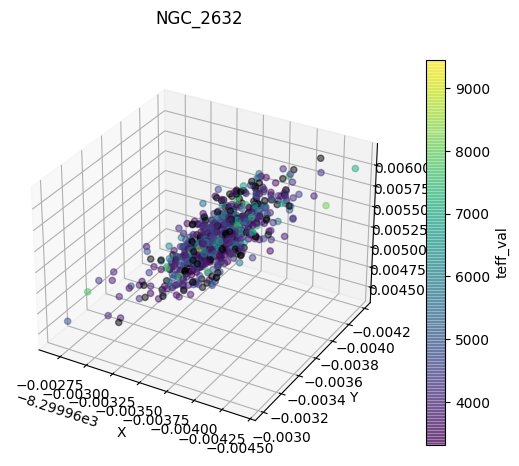

In [7]:
import chronos as cr

t = cr.Target(toiid=5071, verbose=False)
gaia_params = t.query_gaia_dr2_catalog(return_nearest_xmatch=True)
c = cr.Cluster(cluster_name="NGC_2632")
fig = c.plot_xyz_3d(target_gaiaid=t.gaiaid, zlim=(0,100));

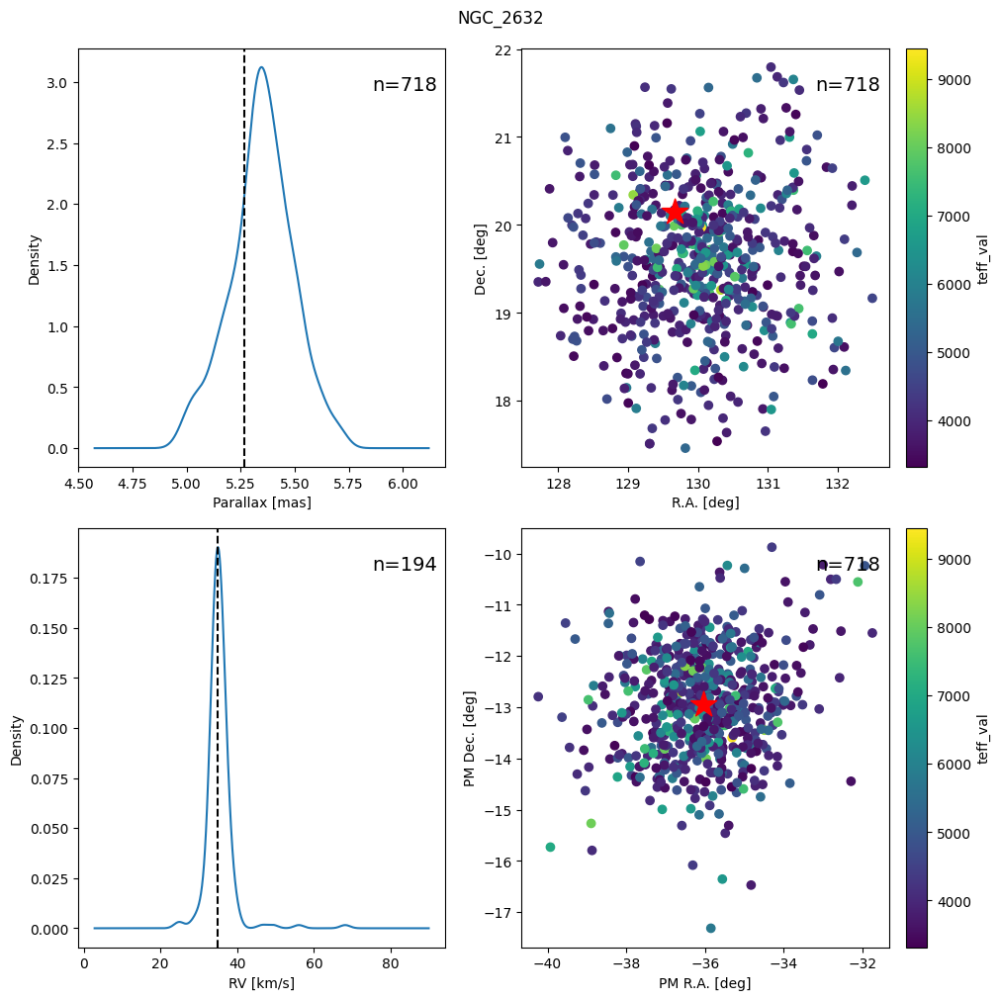

In [8]:
fig = c.plot_rdp_pmrv(target_gaiaid=t.gaiaid);

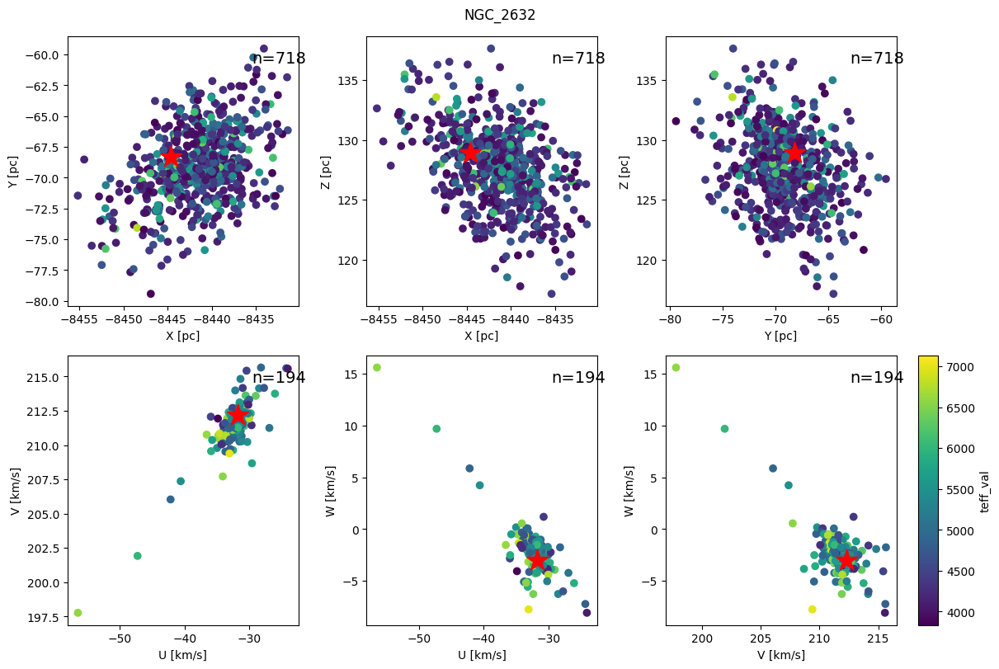

In [9]:
fig = c.plot_xyz_uvw(target_gaiaid=t.gaiaid);

### TOI 5090

There are 3 gaia sources within 30.0 arcsec.
High proper-motion star:
(pmra,pmdec)=(-36.80,-13.13) mas/yr
Using CantatGaudin2020 catalog.
Loaded: /home/jp/github/research/project/chronos/chronos/data/NGC_2632_members.hdf5


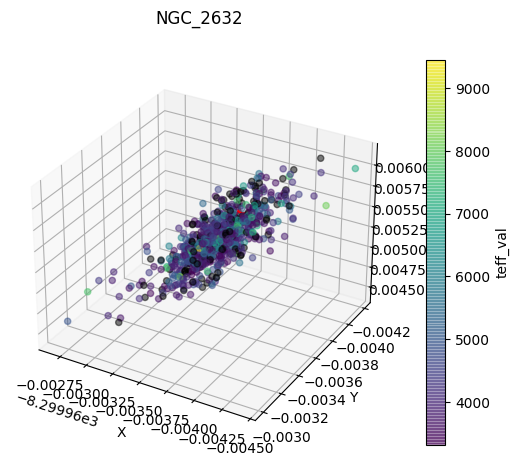

In [4]:
import chronos as cr

t = cr.Target(toiid=5090, verbose=False)
gaia_params = t.query_gaia_dr2_catalog(return_nearest_xmatch=True)
c = cr.Cluster(cluster_name="NGC_2632")
fig = c.plot_xyz_3d(target_gaiaid=t.gaiaid, zlim=(0,100));

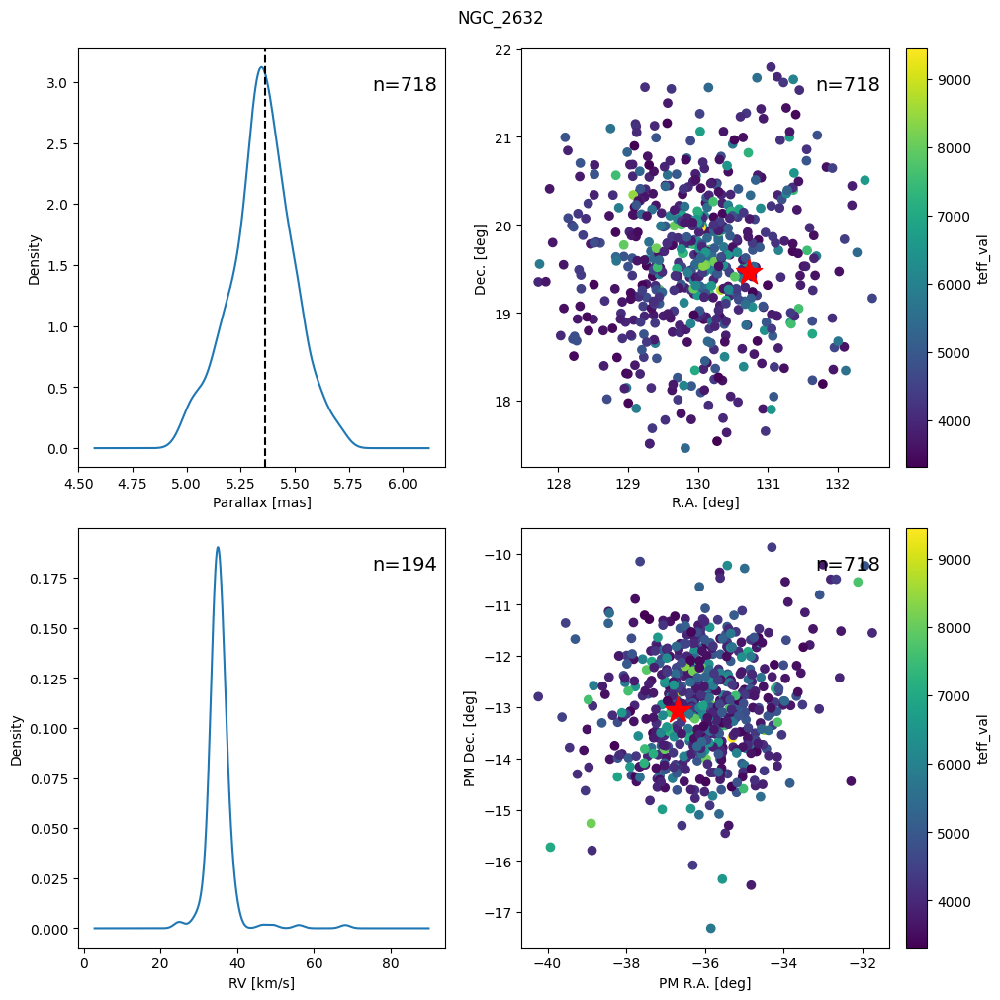

In [5]:
fig = c.plot_rdp_pmrv(target_gaiaid=t.gaiaid);

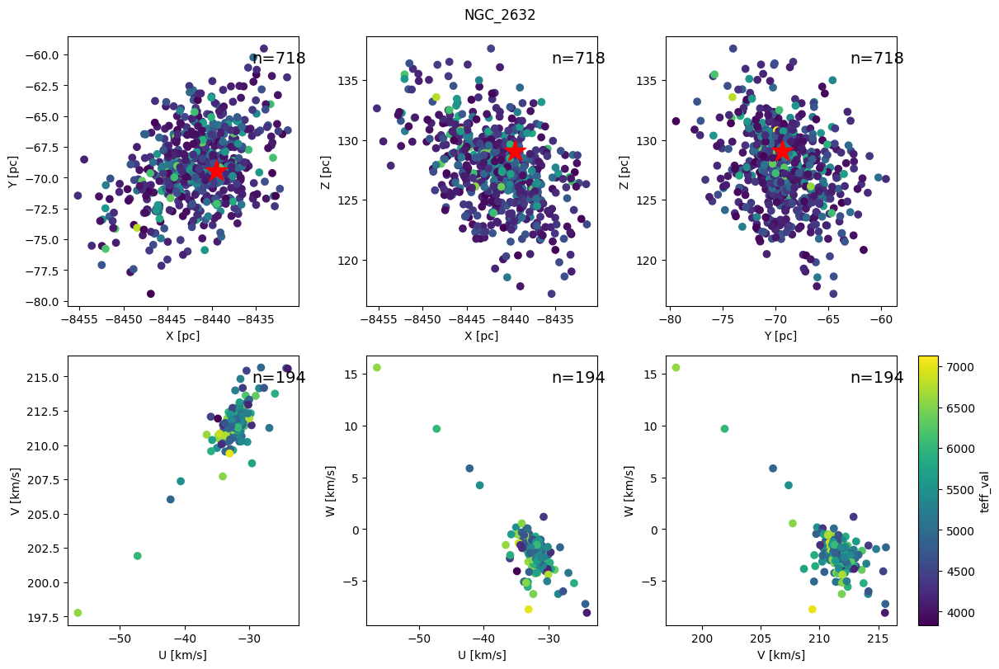

In [6]:
fig = c.plot_xyz_uvw(target_gaiaid=t.gaiaid);

## From He+2022b

In [1]:
import chronos as cr
import pandas as pd

d = pd.read_csv("../../seidan/toi/TOI_in_cluster_candidates.csv", index_col=0)
d

Created TAP+ (v1.2.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443
Created TAP+ (v1.2.1) - Connection:
	Host: geadata.esac.esa.int
	Use HTTPS: True
	Port: 443
	SSL Port: 443


,TOI,RA,Dec,Cluster,Comments
0,580.01,08:12:25.99,-46:06:32.9,Pozzo_1,possible centroid offset towards TIC 81419528;...
1,581.01,08:41:02.75,-41:26:34.06,Trumpler_10,NaN
2,583.01,07:53:54.33,-39:59:34.8,NGC_2451B,NaN
3,681.01,07:51:34.79,-60:24:44.6,NGC_2516,Likely EB; likely too large to be a planet at...
4,1014.01,06:54:14.78,-34:13:22.15,CWNU_1013,phantom TIC; real stars are TIC 772008799 and ...
5,1162.01,20:21:09.44,41:27:44.52,Roslund_6,Matched to 1969293164
6,1227.01,12:27:04.17,-72:27:06.66,CWNU_1136,now have stellar radius
7,1480.01,22:10:27.27,63:33:01.98,CWNU_1115,Need stellar parameters; transiting object cou...
8,1602.01,02:28:31.78,40:53:28.51,UPK_303,2 stars in pixel; correlation with stellar var...
9,1881.01,07:21:28.72,-45:34:03.85,Alessi_3,V-shaped; some odd-even; crowded field; CTOI f...


580.01 Pozzo_1
There are 21 gaia sources within 30.0 arcsec.
astrometric_excess_noise_sig=10.38 (>5 hints binarity).

astrometric_gof_al=21.76 (>20 hints binarity).
See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(-5.99,9.89) mas/yr
Using He2022b catalog.
581.01 Trumpler_10
There are 7 gaia sources within 30.0 arcsec.
astrometric_excess_noise_sig=7.73 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(-11.58,7.16) mas/yr
Using He2022b catalog.
583.01 NGC_2451B
There are 16 gaia sources within 30.0 arcsec.
astrometric_excess_noise_sig=5.43 (>5 hints binarity).

See https://arxiv.org/pdf/1804.11082.pdf

High proper-motion star:
(pmra,pmdec)=(-11.41,4.06) mas/yr
Using He2022b catalog.
681.01 NGC_2516
There are 4 gaia sources within 30.0 arcsec.
High proper-motion star:
(pmra,pmdec)=(-4.18,11.24) mas/yr
Using He2022b catalog.
1014.01 CWNU_1013
There are 7 gaia sources within 30.0 arcsec.
astrometric_excess_

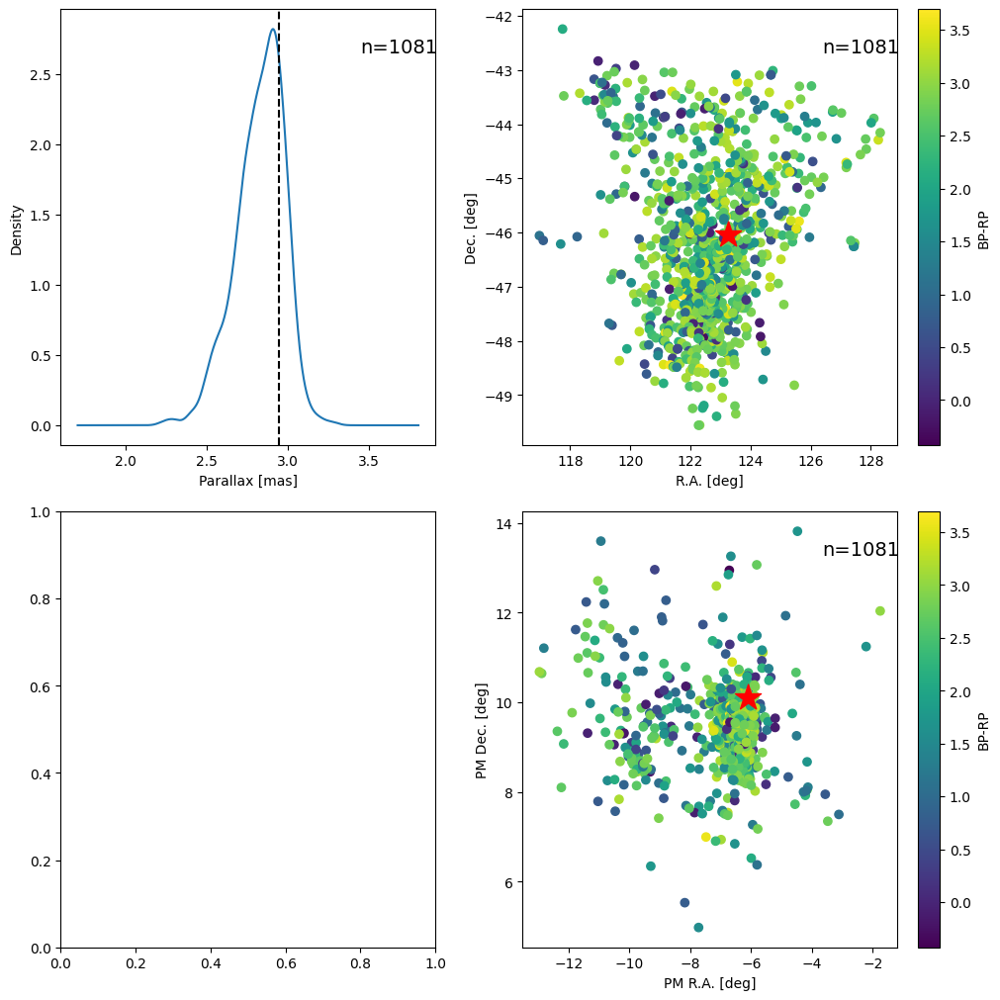

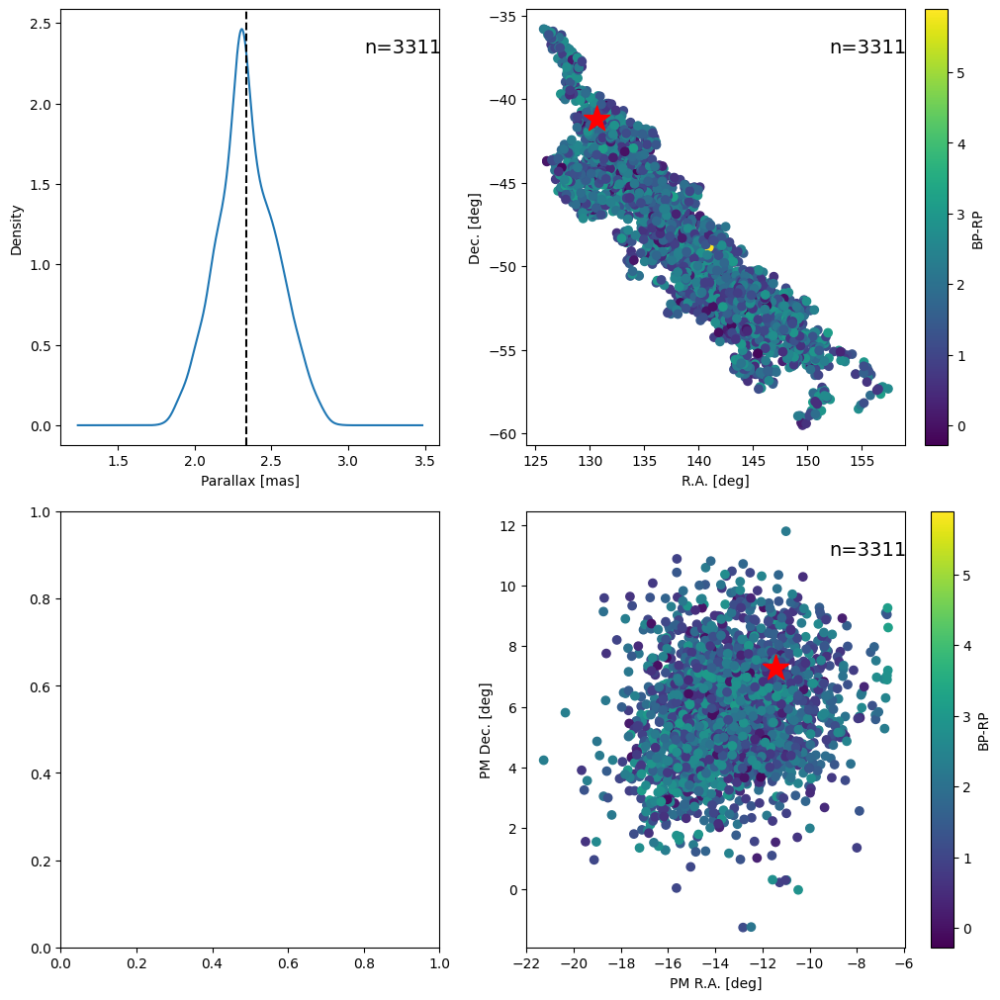

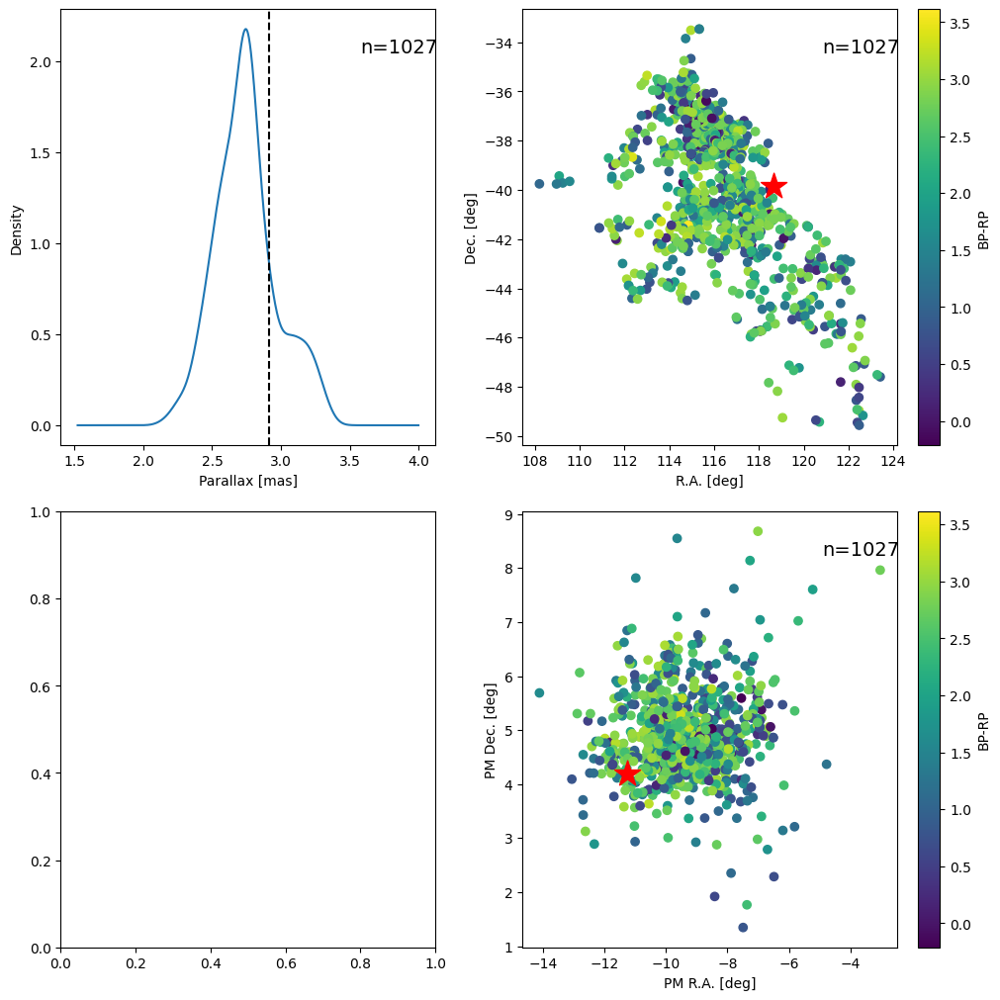

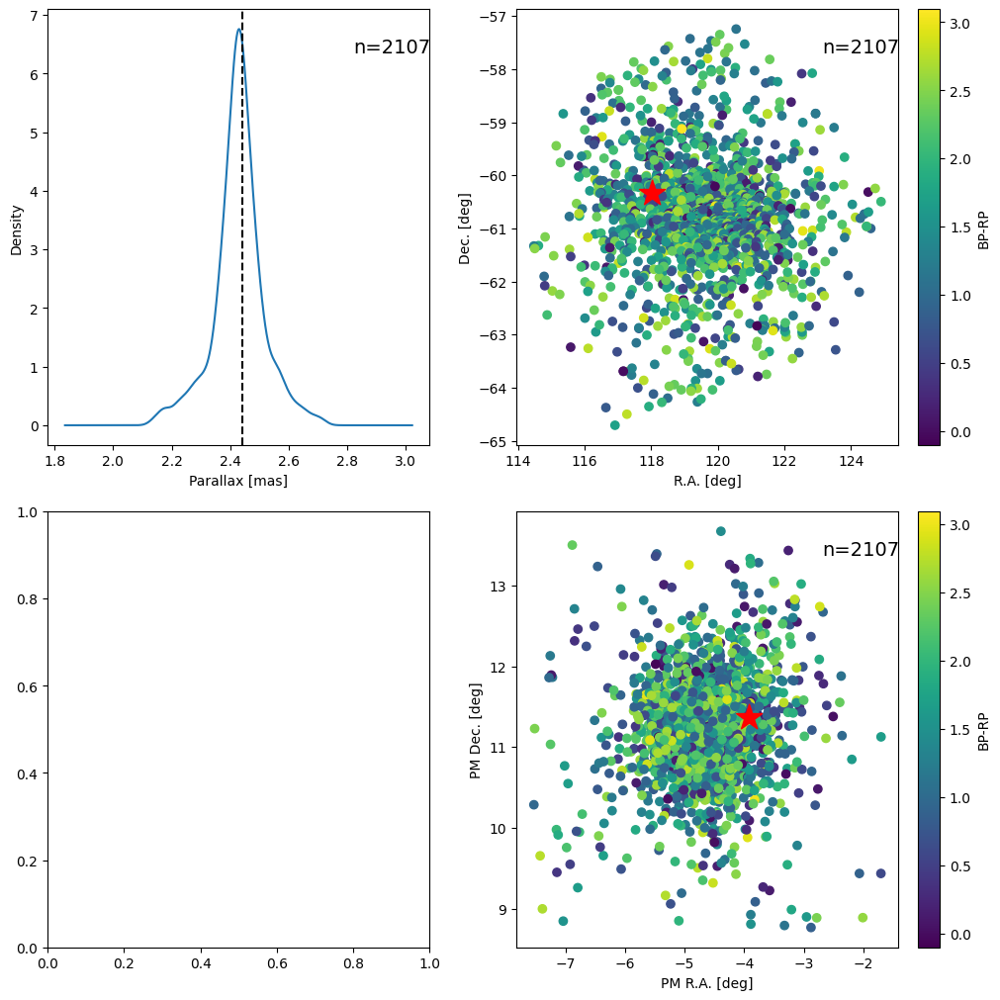

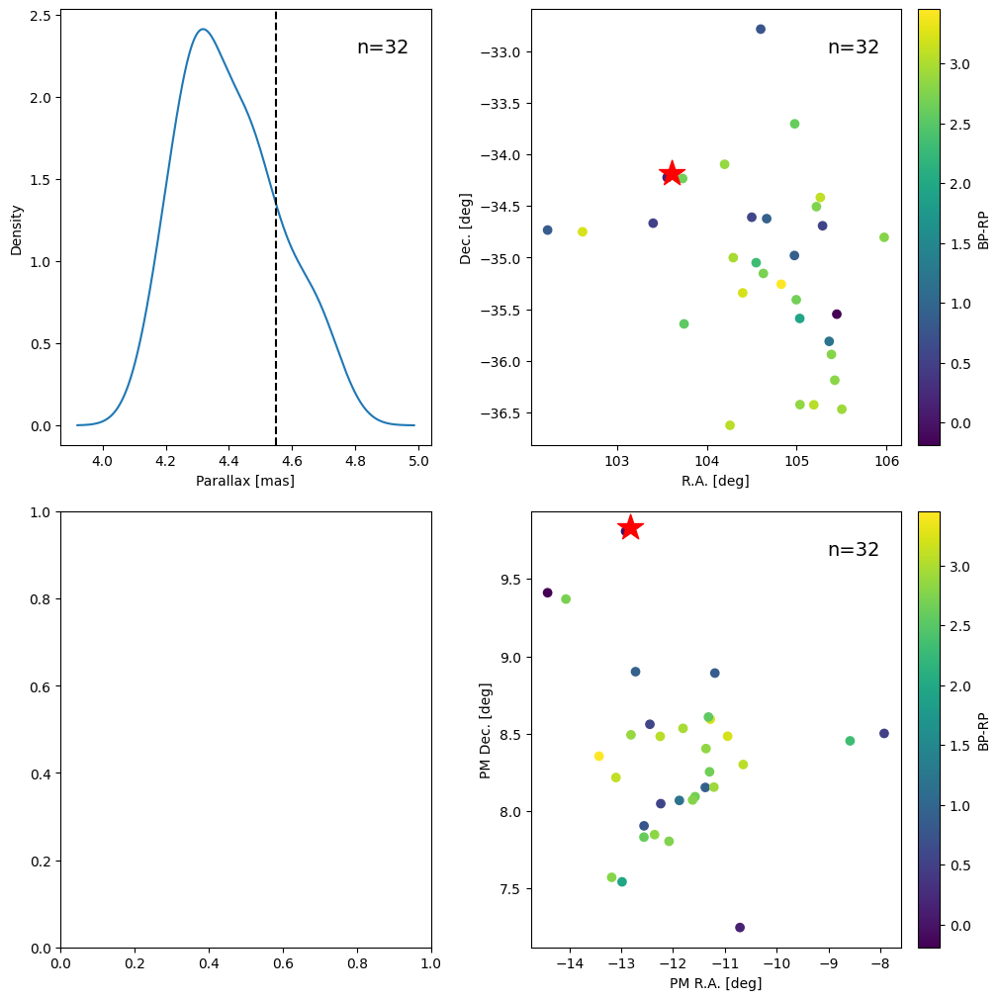

...

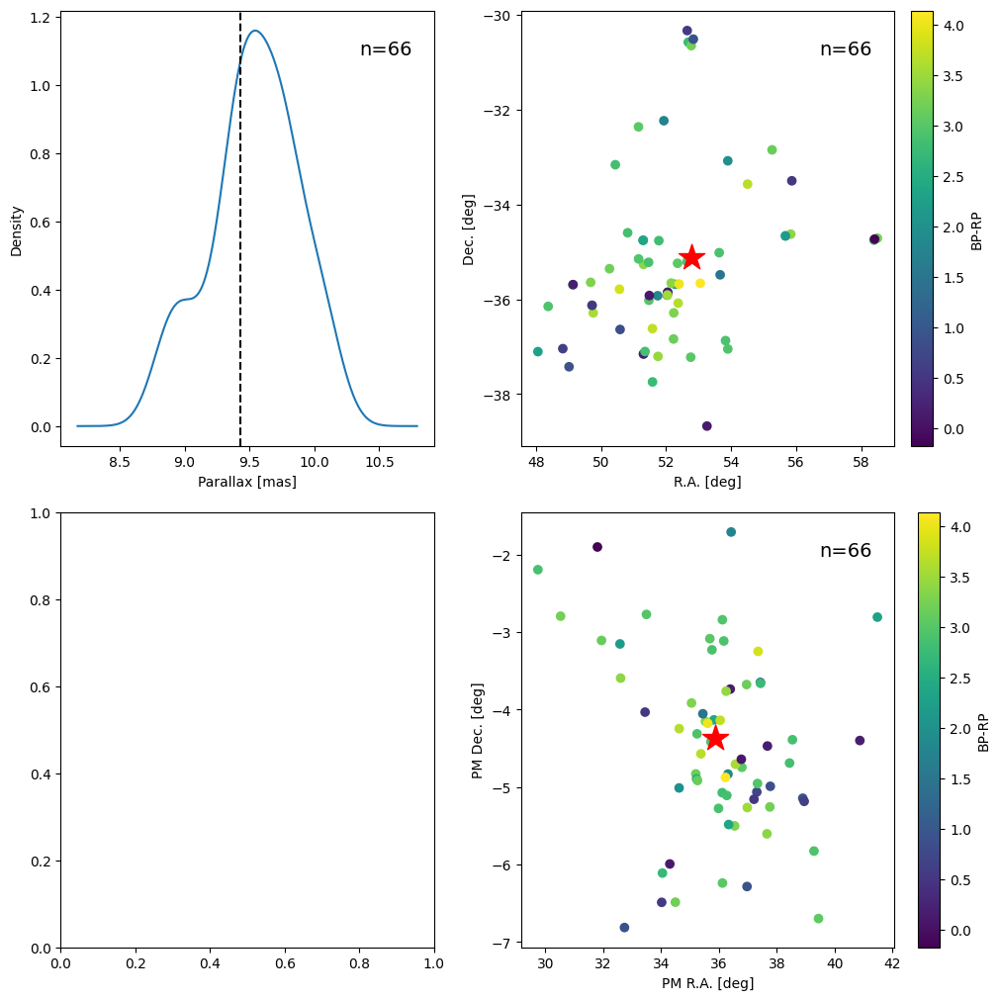

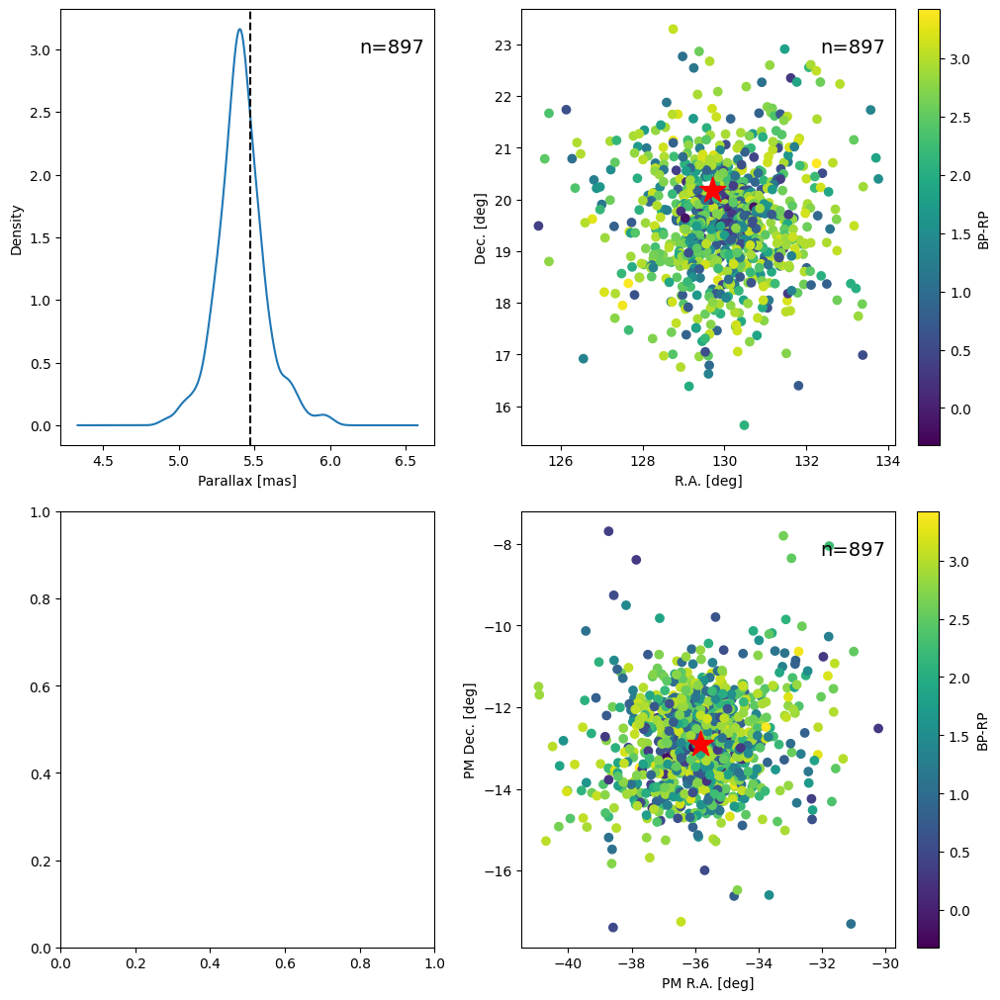

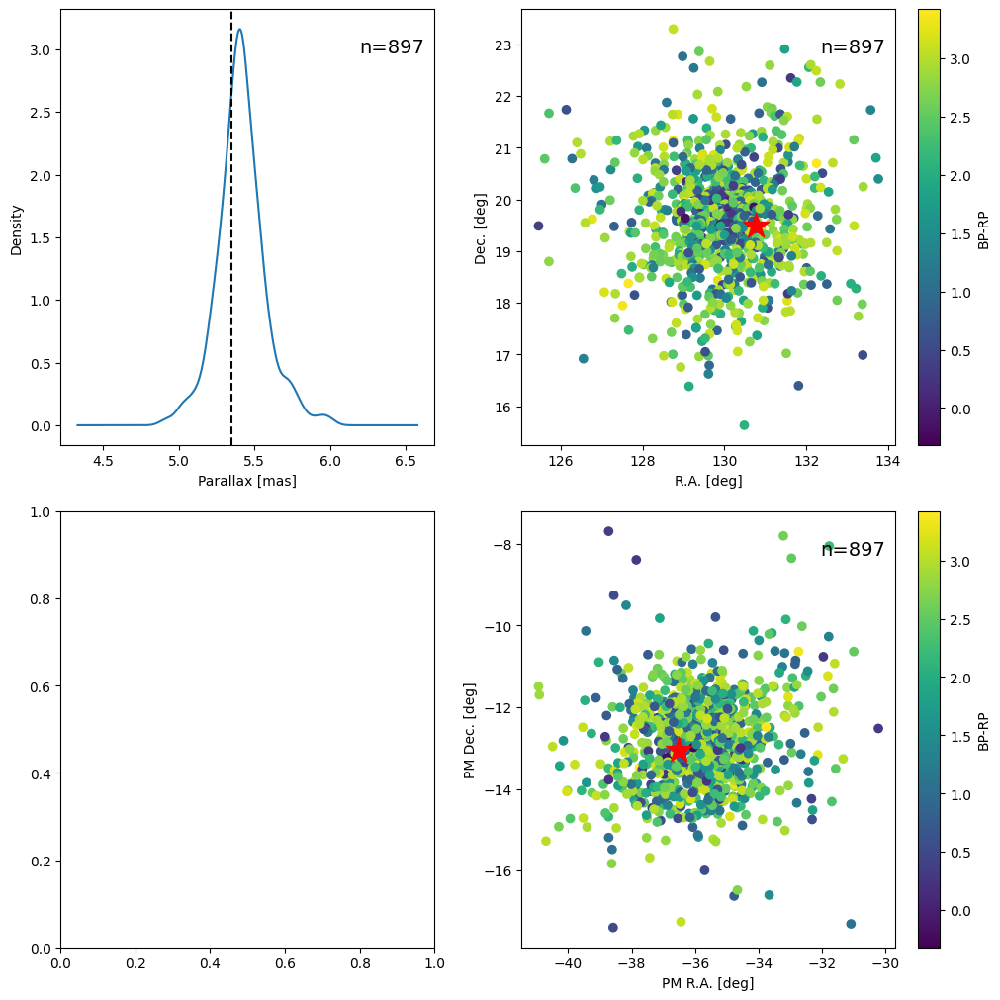

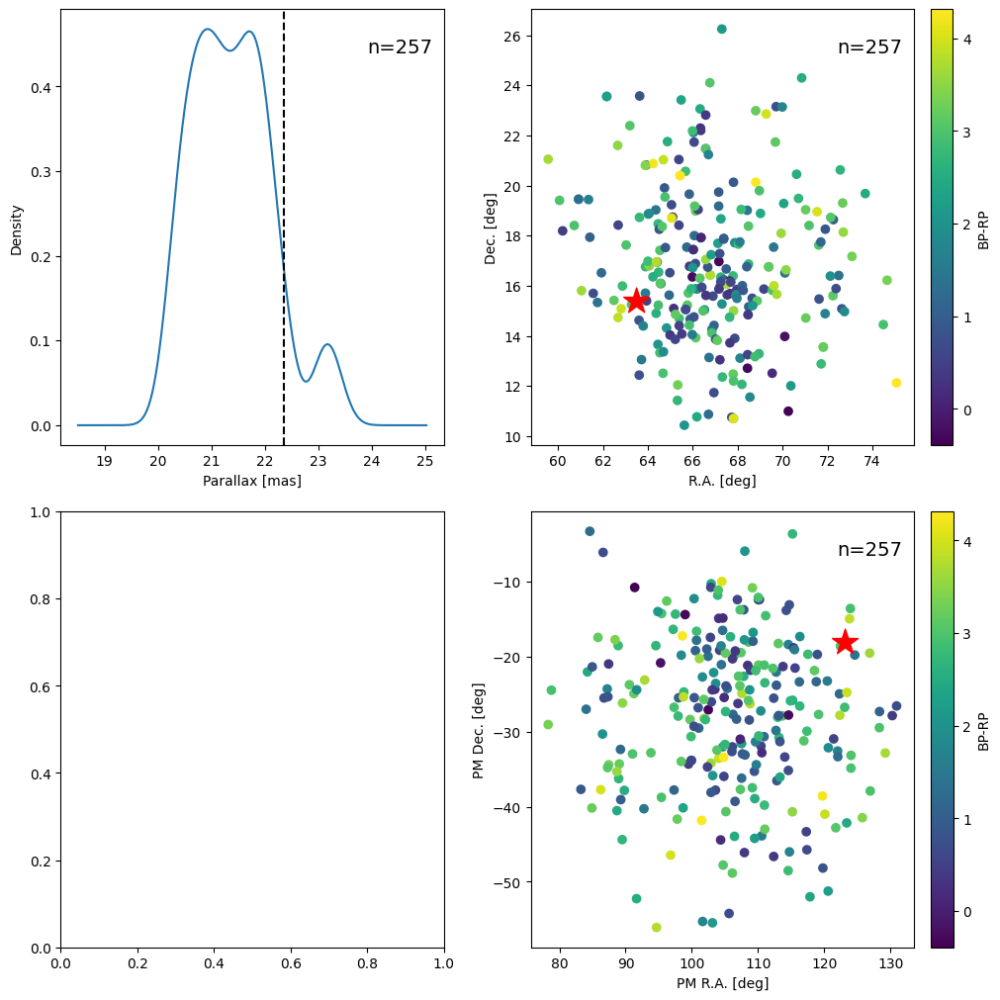

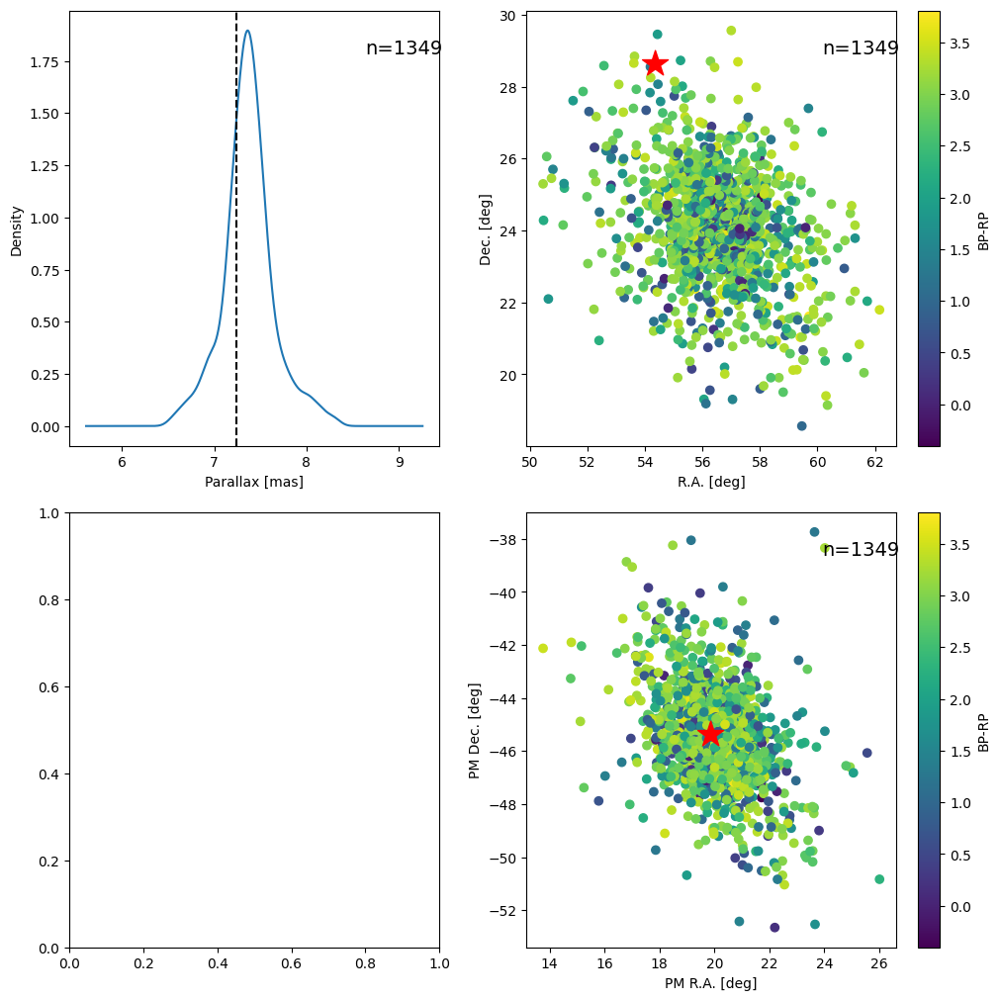

In [5]:
import matplotlib.pyplot as pl

catalog_name="He2022b"
for i,row in d.iterrows():
    print(row.TOI, row.Cluster)
    t = cr.Target(toiid=row.TOI, verbose=False)
    gaia_params = t.query_gaia_dr2_catalog(return_nearest_xmatch=True)
#     nearest_cluster_member = t.get_nearest_cluster_member(catalog_name="He2022b", match_id=False)
#     print(nearest_cluster_member)
    c = cr.Cluster(cluster_name=row.Cluster, catalog_name=catalog_name)
    try:
        # fig = c.plot_xyz_3d(target_gaiaid=t.gaiaid, color="BP-RP");
        fig = c.plot_rdp_pmrv(target_gaiaid=t.gaiaid, color="BP-RP");
        pl.show()
    except Exception as e:
        pass